# Testing CNN classification models on the dataset

In [1]:
import os
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms

# importing sound classification models from torchaudio
import torchaudio

import matplotlib.pyplot as plt
import tqdm

import IPython.display as ipd

In [2]:
# List the available devices:
print("Available devices:")
print(torch.cuda.device_count())
print("List of devices:")
print(torch.cuda.device(0))
print(torch.cuda.get_device_name(0))
print(torch.cuda.device(1))
print(torch.cuda.get_device_name(1))
device_ids = [0, 1]

Available devices:
2
List of devices:
Tesla T4
Tesla T4


In [3]:
# using gpus if available
#device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
#print(device)
os.environ["CUDA_VISIBLE_DEVICES"] = "0,1"  # to use both GPUs


In [4]:
# Loading the dataset
## Structure of the dataset is as follows:
### dataset_folder -> Folder_name_of_one_class -> audio_file.wav
dataset_folder = 'PATH'
animals_folder = dataset_folder + '/Animals'+'/animals_segmented'
music_folder = dataset_folder + '/Music'+'/instruments_segmented'
sot_folder = dataset_folder + '/SoT'+'/sound_of_things_segmented'

In [5]:
# Putting the data paths into dictionaries (key: class, value: list of file names)
data_paths = {
    'animals': [os.path.join(animals_folder, file) for file in os.listdir(animals_folder)],
    'music': [os.path.join(music_folder, file) for file in os.listdir(music_folder)],
    'sot': [os.path.join(sot_folder, file) for file in os.listdir(sot_folder)]
}

animals_dict = {
    "animals": 0,
    "music": 1,
    "sot": 2
}

# print len of each class
print(len(data_paths['animals']))
print(len(data_paths['music']))
print(len(data_paths['sot']))
print("Total number of files: ", len(data_paths['animals']) + len(data_paths['music']) + len(data_paths['sot']))

print(data_paths['animals'][:5])

447
504
454
Total number of files:  1405
['/kaggle/input/trainset/TrainSet/Animals/animals_segmented/YIAXl7VjxHAM.wav', '/kaggle/input/trainset/TrainSet/Animals/animals_segmented/YF4XKK8D22rY.wav', '/kaggle/input/trainset/TrainSet/Animals/animals_segmented/YO7SINEL58Ms.wav', '/kaggle/input/trainset/TrainSet/Animals/animals_segmented/Y8d3WbkLC7Gw.wav', '/kaggle/input/trainset/TrainSet/Animals/animals_segmented/Y2dazr-GBSFY.wav']


In [6]:
# Tuple to tensor of numbers
def name_tuple_to_float_tensor(tuple):
    # Read the content of the tupe and use animals_dict to convert the class name to a number in a new tensor
    return torch.tensor([animals_dict[tuple[i]] for i in range(len(tuple))], dtype=torch.float32)

In [7]:
import torch
from torch.utils.data import Dataset
num_classes = 3
class AudioDataset(Dataset):
    def __init__(self, data_paths, transform=None):
        self.data_paths = data_paths
        self.classes = list(data_paths.keys())
        self.files = sum([data_paths[cls] for cls in self.classes], [])
        self.transform = transform
        self.printPath = False

    def __len__(self):
        return len(self.files)

    def __getitem__(self, idx):
        for cls in self.classes:
            if idx < len(self.data_paths[cls]):
                file = self.data_paths[cls][idx]
                classe = cls
                break
            idx -= len(self.data_paths[cls])
        else:
            raise IndexError('Index out of range')

        waveform, sample_rate = torchaudio.load(file)
        if self.transform:
            mfcc = self.transform(waveform)
        
        if True:
            # Taking a mean tensor of the mfcc 2 channel tensor
            mfcc = torch.mean(mfcc, dim=0)
    
        if self.printPath:
            return mfcc, sample_rate, classe, file
        else:
            return mfcc, sample_rate, classe

In [8]:
transforms = torchaudio.transforms.MFCC(
    sample_rate= 48000,
    n_mfcc=40,
    melkwargs={
        'n_fft': 400,
        'hop_length': 160,
        'n_mels': 128
    })
#transforms = torchaudio.transforms.MFCC(
 #   sample_rate= 48000,
  #  n_mfcc=20)

/opt/conda/lib/python3.10/site-packages/torchaudio/functional/functional.py:584: UserWarning: At least one mel filterbank has all zero values. The value for `n_mels` (128) may be set too high. Or, the value for `n_freqs` (201) may be set too low.
  warnings.warn(


In [9]:
dataset = AudioDataset(data_paths, transform=transforms)
mfcctensor, sample_rate, classe = dataset.__getitem__(0)
print(mfcctensor.shape, sample_rate, classe)

print(mfcctensor)

torch.Size([40, 3001]) 48000 animals
tensor([[-200.8563, -362.0678, -412.4749,  ..., -336.3416, -275.5495,
         -178.4266],
        [ -59.0096,  -29.2521,  -37.6446,  ...,   -2.6386,  -23.1018,
          -21.0079],
        [-117.4281,  -86.6991,  -74.0724,  ...,  -69.4863,  -87.2835,
         -104.7252],
        ...,
        [ -10.2031,   -6.8450,   -2.0041,  ...,  -15.8154,  -12.6054,
           -8.6286],
        [  -9.6286,   -9.0642,   -4.9298,  ...,    2.9605,  -10.7959,
          -18.6853],
        [  -5.3229,    3.0649,    7.8135,  ...,    2.7072,   -1.5437,
          -10.1137]])


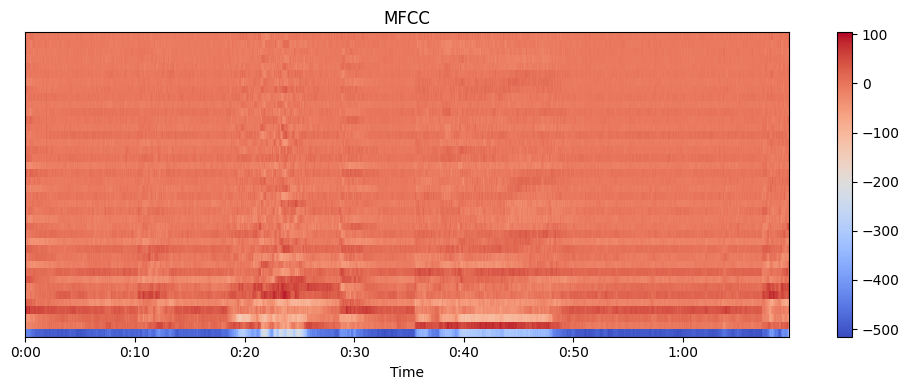

In [10]:
import librosa.display
import matplotlib.pyplot as plt

# Select one channel of the MFCC tensor
mfcc_channel_1 = mfcctensor.detach().numpy() # mfcctensor[0].detach().numpy()

# Plot the MFCC
plt.figure(figsize=(10, 4))
librosa.display.specshow(mfcc_channel_1, x_axis='time')
plt.colorbar()
plt.title('MFCC')
plt.tight_layout()
plt.show()

In [11]:
BATCH_SIZE = 32

# Split the dataset into training, validation and test sets
train_size = int(0.8 * len(dataset))
val_size = int(0.1 * len(dataset))
test_size = len(dataset) - train_size - val_size
train_dataset, val_dataset, test_dataset = torch.utils.data.random_split(dataset, [train_size, val_size, test_size])
print(len(train_dataset), len(val_dataset), len(test_dataset))
print(len(train_dataset) + len(val_dataset) + len(test_dataset))

# Create dataloaders for the training, validation and test sets
train_dataloader = torch.utils.data.DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True)
val_dataloader = torch.utils.data.DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=True)
test_dataloader = torch.utils.data.DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=True)

# get the first element of the dataloader
dataiter = iter(train_dataloader)
mfcctensor, sample_rate, classe = next(dataiter)
print(mfcctensor.shape, sample_rate, classe)


1124 140 141
1405
torch.Size([32, 40, 3001]) tensor([48000, 48000, 48000, 48000, 48000, 48000, 48000, 48000, 48000, 48000,
        48000, 48000, 48000, 48000, 48000, 48000, 48000, 48000, 48000, 48000,
        48000, 48000, 48000, 48000, 48000, 48000, 48000, 48000, 48000, 48000,
        48000, 48000]) ('animals', 'animals', 'sot', 'music', 'music', 'sot', 'sot', 'music', 'music', 'music', 'music', 'animals', 'music', 'music', 'music', 'sot', 'music', 'animals', 'animals', 'music', 'sot', 'animals', 'animals', 'sot', 'music', 'animals', 'music', 'sot', 'music', 'animals', 'music', 'sot')


In [12]:
dataset_with_path = AudioDataset(data_paths, transform=transforms)
dataset_with_path.printPath = True
test_dataloader_with_path = torch.utils.data.DataLoader(dataset_with_path, batch_size=BATCH_SIZE, shuffle=True)


# ANNs

In [13]:
torch.cuda.empty_cache()

In [14]:
class SimpleCNN(nn.Module):
    def __init__(self):
        super(SimpleCNN, self).__init__()
        self.conv1 = nn.Conv2d(1, 12, kernel_size=5)
        self.conv2 = nn.Conv2d(12, 64, kernel_size=5)
        self.fc1 = nn.Linear(334656, 3)  # Adjust the parameters here to match the original model

    def forward(self, x):
        #print(x.shape)
        x = x.unsqueeze(1)  # Add a channel dimension
        #print(x.shape)
        x = self.conv1(x)
        #print(x.shape)
        x = F.max_pool2d(x, 2)
        x = self.conv2(x)
        #print(x.shape)
        x = F.max_pool2d(x, 2)
        #print(x.shape)
        x = x.view(x.size(0), -1)  # Flatten the tensor
        #print(x.shape)
        x = self.fc1(x)  # Replace with your desired activation function
        return F.log_softmax(x, dim=1)

model = SimpleCNN()
print(model)

SimpleCNN(
  (conv1): Conv2d(1, 12, kernel_size=(5, 5), stride=(1, 1))
  (conv2): Conv2d(12, 64, kernel_size=(5, 5), stride=(1, 1))
  (fc1): Linear(in_features=334656, out_features=3, bias=True)
)


In [15]:
# Instantiate the model and move it to the GPU if available
model = SimpleCNN()
model = nn.DataParallel(model, device_ids=device_ids)
model = model.cuda()
EPOCH = 50
# Define the loss function and the optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=1e-6)

loss_evolution = []
accuracy_evolution = []

# Training loop
for epoch in tqdm.trange(EPOCH):
    running_loss = 0.0
    correct = 0
    total = 0

    for i, data in enumerate(train_dataloader, 0):
        # get the inputs; data is a list of [inputs, labels]
        inputs, _, labels = data
        inputs = inputs.cuda()
        
        labels = name_tuple_to_float_tensor(labels).cuda()
        labels = labels.long()
        
        # zero the parameter gradients
        optimizer.zero_grad()

        # forward + backward + optimize
        outputs = model(inputs)
        loss = criterion(outputs, labels)
        loss_evolution.append(loss.item())
        loss.backward()
        optimizer.step()

        # print statistics
        running_loss += loss.item()

    # Accuracy computation
    with torch.no_grad():
        for data in val_dataloader:
            
            inputs, _, labels = data
            inputs = inputs.cuda()
            labels = name_tuple_to_float_tensor(labels).cuda()
            labels = labels.long()       
            
            outputs = model(inputs)
            _, predicted = torch.max(outputs.data, 1)
            total += len(labels)
            correct += (predicted == labels).sum().item()

    accuracy_evolution.append(100 * correct / total)
    print('[%d] loss: %.3f | Accuracy: %d %%' % (epoch + 1, running_loss / len(train_dataloader), 100 * correct / total))

print('Finished Training')


  2%|▏         | 1/50 [01:36<1:18:37, 96.27s/it]

[1] loss: 1.810 | Accuracy: 46 %


  4%|▍         | 2/50 [02:28<56:23, 70.49s/it]  

[2] loss: 1.324 | Accuracy: 53 %


  6%|▌         | 3/50 [03:18<47:53, 61.14s/it]

[3] loss: 1.237 | Accuracy: 51 %


  8%|▊         | 4/50 [04:09<43:42, 57.00s/it]

[4] loss: 1.115 | Accuracy: 56 %


 10%|█         | 5/50 [04:59<40:51, 54.48s/it]

[5] loss: 0.991 | Accuracy: 53 %


 12%|█▏        | 6/50 [05:50<38:59, 53.18s/it]

[6] loss: 0.930 | Accuracy: 57 %


 14%|█▍        | 7/50 [06:40<37:27, 52.26s/it]

[7] loss: 0.912 | Accuracy: 59 %


 16%|█▌        | 8/50 [07:30<36:04, 51.55s/it]

[8] loss: 0.888 | Accuracy: 50 %


 18%|█▊        | 9/50 [08:21<35:06, 51.37s/it]

[9] loss: 0.820 | Accuracy: 60 %


 20%|██        | 10/50 [09:11<34:02, 51.06s/it]

[10] loss: 0.746 | Accuracy: 60 %


 22%|██▏       | 11/50 [10:02<33:01, 50.82s/it]

[11] loss: 0.745 | Accuracy: 55 %


 24%|██▍       | 12/50 [10:52<32:04, 50.65s/it]

[12] loss: 0.782 | Accuracy: 54 %


 26%|██▌       | 13/50 [11:42<31:06, 50.45s/it]

[13] loss: 0.647 | Accuracy: 60 %


 28%|██▊       | 14/50 [12:33<30:19, 50.56s/it]

[14] loss: 0.618 | Accuracy: 60 %


 30%|███       | 15/50 [13:23<29:31, 50.60s/it]

[15] loss: 0.586 | Accuracy: 57 %


 32%|███▏      | 16/50 [14:14<28:37, 50.50s/it]

[16] loss: 0.566 | Accuracy: 54 %


 34%|███▍      | 17/50 [15:04<27:46, 50.51s/it]

[17] loss: 0.547 | Accuracy: 53 %


 36%|███▌      | 18/50 [15:55<26:55, 50.49s/it]

[18] loss: 0.632 | Accuracy: 61 %


 38%|███▊      | 19/50 [16:45<26:01, 50.38s/it]

[19] loss: 0.489 | Accuracy: 61 %


 40%|████      | 20/50 [17:35<25:11, 50.39s/it]

[20] loss: 0.459 | Accuracy: 58 %


 42%|████▏     | 21/50 [18:26<24:27, 50.59s/it]

[21] loss: 0.449 | Accuracy: 62 %


 44%|████▍     | 22/50 [19:17<23:40, 50.75s/it]

[22] loss: 0.409 | Accuracy: 59 %


 46%|████▌     | 23/50 [20:08<22:49, 50.72s/it]

[23] loss: 0.460 | Accuracy: 62 %


 48%|████▊     | 24/50 [20:58<21:57, 50.66s/it]

[24] loss: 0.445 | Accuracy: 63 %


 50%|█████     | 25/50 [21:49<21:07, 50.69s/it]

[25] loss: 0.377 | Accuracy: 63 %


 52%|█████▏    | 26/50 [22:39<20:11, 50.47s/it]

[26] loss: 0.369 | Accuracy: 60 %


 54%|█████▍    | 27/50 [23:30<19:20, 50.47s/it]

[27] loss: 0.340 | Accuracy: 63 %


 56%|█████▌    | 28/50 [24:20<18:31, 50.54s/it]

[28] loss: 0.332 | Accuracy: 64 %


 58%|█████▊    | 29/50 [25:11<17:41, 50.55s/it]

[29] loss: 0.310 | Accuracy: 63 %


 60%|██████    | 30/50 [26:01<16:50, 50.55s/it]

[30] loss: 0.283 | Accuracy: 62 %


 62%|██████▏   | 31/50 [26:52<15:59, 50.49s/it]

[31] loss: 0.300 | Accuracy: 65 %


 64%|██████▍   | 32/50 [27:43<15:11, 50.62s/it]

[32] loss: 0.270 | Accuracy: 65 %


 66%|██████▌   | 33/50 [28:33<14:20, 50.60s/it]

[33] loss: 0.275 | Accuracy: 67 %


 68%|██████▊   | 34/50 [29:24<13:30, 50.68s/it]

[34] loss: 0.247 | Accuracy: 64 %


 76%|███████▌  | 38/50 [32:49<10:12, 51.07s/it]

[38] loss: 0.207 | Accuracy: 66 %


 78%|███████▊  | 39/50 [33:40<09:22, 51.12s/it]

[39] loss: 0.205 | Accuracy: 62 %


 80%|████████  | 40/50 [34:30<08:29, 50.97s/it]

[40] loss: 0.194 | Accuracy: 64 %


 82%|████████▏ | 41/50 [35:21<07:38, 50.95s/it]

[41] loss: 0.195 | Accuracy: 67 %


 84%|████████▍ | 42/50 [36:13<06:49, 51.15s/it]

[42] loss: 0.178 | Accuracy: 67 %


 86%|████████▌ | 43/50 [37:04<05:58, 51.16s/it]

[43] loss: 0.180 | Accuracy: 63 %


 88%|████████▊ | 44/50 [37:56<05:07, 51.24s/it]

[44] loss: 0.166 | Accuracy: 63 %


 90%|█████████ | 45/50 [38:47<04:15, 51.19s/it]

[45] loss: 0.158 | Accuracy: 66 %


 92%|█████████▏| 46/50 [39:39<03:26, 51.54s/it]

[46] loss: 0.152 | Accuracy: 65 %


 94%|█████████▍| 47/50 [40:31<02:35, 51.82s/it]

[47] loss: 0.156 | Accuracy: 63 %


 96%|█████████▌| 48/50 [41:23<01:43, 51.81s/it]

[48] loss: 0.143 | Accuracy: 67 %


 98%|█████████▊| 49/50 [42:15<00:51, 51.89s/it]

[49] loss: 0.137 | Accuracy: 63 %


100%|██████████| 50/50 [43:07<00:00, 51.75s/it]

[50] loss: 0.138 | Accuracy: 67 %
Finished Training


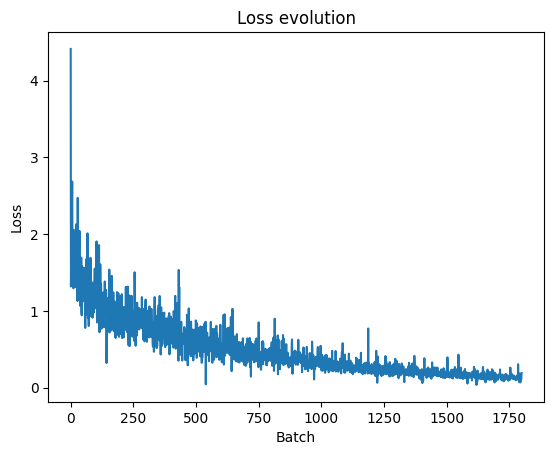

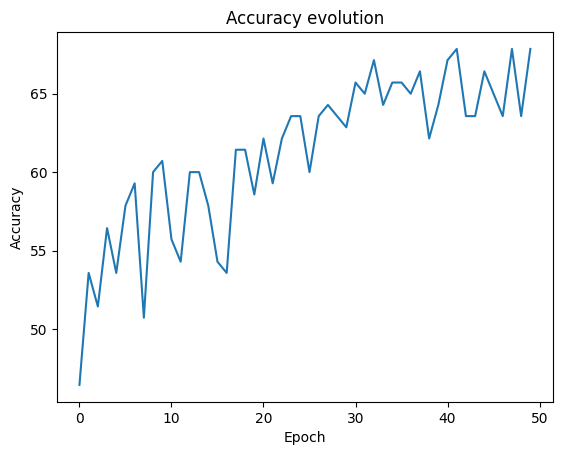

In [16]:
# Plot the loss evolution
plt.plot(loss_evolution)
plt.title('Loss evolution')
plt.xlabel('Batch')
plt.ylabel('Loss')
plt.show()

# Plot the accuracy evolution
plt.plot(accuracy_evolution)
plt.title('Accuracy evolution')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.show()

# Save the model
torch.save(model.state_dict(), 'simple_cnn_40_nmfcc.pth')

[[30 11  7]
 [ 4 41  6]
 [11 10 21]]
              precision    recall  f1-score   support

     animals       0.67      0.62      0.65        48
       music       0.66      0.80      0.73        51
         sot       0.62      0.50      0.55        42

    accuracy                           0.65       141
   macro avg       0.65      0.64      0.64       141
weighted avg       0.65      0.65      0.65       141



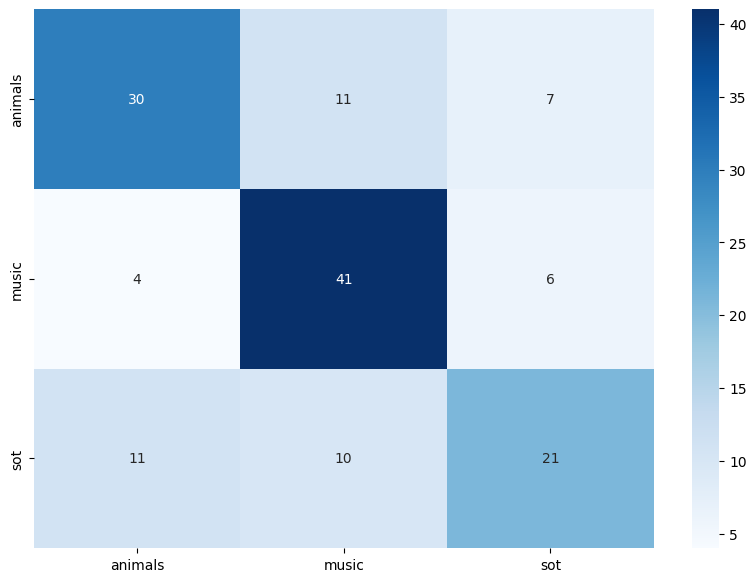

In [17]:
# Confusion matrix
from sklearn.metrics import confusion_matrix

# Get the predictions for the test set
y_pred = []
y_true = []

with torch.no_grad():
    for data in test_dataloader:
        inputs, _, labels = data
        inputs = inputs.cuda()
        labels = name_tuple_to_float_tensor(labels).cuda()
        labels = labels.long()
        outputs = model(inputs)
        _, predicted = torch.max(outputs.data, 1)
        y_pred += predicted.tolist()
        y_true += labels.tolist()

# Compute and print a pretty confusion matrix
conf_matrix = confusion_matrix(y_true, y_pred)
print(conf_matrix)

import seaborn as sns
import pandas as pd
import matplotlib.pyplot as plt

# Create a dataframe from the confusion matrix
df_cm = pd.DataFrame(conf_matrix, index = [i for i in ['animals', 'music', 'sot']],
                  columns = [i for i in ['animals', 'music', 'sot']])
plt.figure(figsize = (10,7))
sns.heatmap(df_cm, annot=True, cmap='Blues')

# Print the classification report
from sklearn.metrics import classification_report
print(classification_report(y_true, y_pred, target_names=['animals', 'music', 'sot']))


In [18]:
# Get 1 prediction for the test set with the file paths
dataiter = iter(test_dataloader_with_path)
mfcctensor, sample_rate, classe, file = next(dataiter)
print(mfcctensor.shape, sample_rate, classe, file)

# Get the prediction for the test set
with torch.no_grad():
    inputs = mfcctensor.cuda()
    outputs = model(inputs)
    _, predicted = torch.max(outputs.data, 1)
print("Predicted: ", predicted, "True: ", name_tuple_to_float_tensor(classe).long(), "Class: ", classe)

# Read with ipython.display.Audio
waveform, sample_rate = torchaudio.load(file[0])
ipd.Audio(waveform, rate=sample_rate)

torch.Size([32, 40, 3001]) tensor([48000, 48000, 48000, 48000, 48000, 48000, 48000, 48000, 48000, 48000,
        48000, 48000, 48000, 48000, 48000, 48000, 48000, 48000, 48000, 48000,
        48000, 48000, 48000, 48000, 48000, 48000, 48000, 48000, 48000, 48000,
        48000, 48000]) ('animals', 'music', 'sot', 'sot', 'sot', 'music', 'animals', 'sot', 'sot', 'animals', 'music', 'music', 'music', 'music', 'music', 'animals', 'sot', 'animals', 'sot', 'music', 'animals', 'sot', 'sot', 'music', 'music', 'music', 'music', 'music', 'sot', 'sot', 'animals', 'sot') ('/kaggle/input/trainset/TrainSet/Animals/animals_segmented/YQHWuQj95SYw.wav', '/kaggle/input/trainset/TrainSet/Music/instruments_segmented/YHXG8DnTpyPc.wav', '/kaggle/input/trainset/TrainSet/SoT/sound_of_things_segmented/Y3512ivmqzbo.wav', '/kaggle/input/trainset/TrainSet/SoT/sound_of_things_segmented/Y4vxBWzOWBZU.wav', '/kaggle/input/trainset/TrainSet/SoT/sound_of_things_segmented/YHlkTBzP1bYY.wav', '/kaggle/input/trainset/TrainSet

## Other models

In [19]:
torch.cuda.empty_cache()

In [20]:
!pip install efficientnet_pytorch

  Preparing metadata (setup.py) ... done
  Created wheel for efficientnet_pytorch: filename=efficientnet_pytorch-0.7.1-py3-none-any.whl size=16428 sha256=5608c550337b2a664dfd0de8645fb1ced18e1132472797f3e8cb2e545afbf741
  Stored in directory: /root/.cache/pip/wheels/03/3f/e9/911b1bc46869644912bda90a56bcf7b960f20b5187feea3baf
Successfully built efficientnet_pytorch


In [21]:
# Importer les modèles nécessaires de torchaudio
# resnet 50, resnet 101
from torchvision.models import resnet50
# efficientnet b0
from efficientnet_pytorch import EfficientNet 

model_efficientnet = EfficientNet.from_pretrained('efficientnet-b0')
model_resnet50 = resnet50(pretrained=True)
num_classes = 3

Downloading: "https://github.com/lukemelas/EfficientNet-PyTorch/releases/download/1.0/efficientnet-b0-355c32eb.pth" to /root/.cache/torch/hub/checkpoints/efficientnet-b0-355c32eb.pth
100%|██████████| 20.4M/20.4M [00:00<00:00, 148MB/s] 
/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Loaded pretrained weights for efficientnet-b0


Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth
100%|██████████| 97.8M/97.8M [00:00<00:00, 146MB/s] 


### RESNET50

In [22]:
# Modify the first convolution layer to accept 1 channel instead of 3
model_resnet50.conv1 = nn.Conv2d(1, 64, kernel_size=7, stride=2, padding=3, bias=False)
# Modify the fully connected layer for your specific task
model_resnet50.fc = nn.Linear(2048, num_classes)

model = model_resnet50
model = nn.DataParallel(model, device_ids=device_ids)
model = model.cuda()

# Define the loss function and the optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=1e-6)

# Training loop
EPOCH = 50

loss_evolution = []
accuracy_evolution = []

for epoch in tqdm.trange(EPOCH):
    running_loss = 0.0
    correct = 0
    total = 0

    for i, data in enumerate(train_dataloader, 0):
        # get the inputs; data is a list of [inputs, labels]
        inputs, _, labels = data
        inputs = inputs.cuda()
        inputs = inputs.unsqueeze(1)
        labels = name_tuple_to_float_tensor(labels).cuda()
        labels = labels.long()
        
        # Transform inputs from tensor of size torch.Size([32, 40, 3001]) to tensor of size torch.Size([32, 3, 40, 3001]) following RVB format
        #inputs = torch.stack([inputs, inputs, inputs], dim=1)
        
        # zero the parameter gradients
        optimizer.zero_grad()
        

        # forward + backward + optimize
        outputs = model(inputs)

        loss = criterion(outputs, labels)
        loss_evolution.append(loss.item())
        loss.backward()
        optimizer.step()

        # print statistics
        running_loss += loss.item()
        

    # Accuracy computation
    with torch.no_grad():
        for data in val_dataloader:
            inputs, _, labels = data
            inputs = inputs.cuda()
            inputs = inputs.unsqueeze(1)
            labels = name_tuple_to_float_tensor(labels).cuda()
            labels = labels.long()
            
            #inputs = torch.stack([inputs, inputs, inputs], dim=1)
            outputs = model(inputs)
            _, predicted = torch.max(outputs.data, 1)
            total += len(labels)
            correct += (predicted == labels).sum().item()
            

    accuracy_evolution.append(100 * correct / total)
    print('[%d] loss: %.3f | Accuracy: %d %%' % (epoch + 1, running_loss / len(train_dataloader), 100 * correct / total))

  2%|▏         | 1/50 [01:06<53:56, 66.04s/it]

[1] loss: 1.114 | Accuracy: 36 %


  4%|▍         | 2/50 [02:11<52:36, 65.76s/it]

[2] loss: 1.064 | Accuracy: 43 %


  6%|▌         | 3/50 [03:16<51:22, 65.59s/it]

[3] loss: 1.028 | Accuracy: 44 %


  8%|▊         | 4/50 [04:22<50:10, 65.44s/it]

[4] loss: 0.998 | Accuracy: 48 %


 10%|█         | 5/50 [05:27<49:02, 65.40s/it]

[5] loss: 0.969 | Accuracy: 55 %


 12%|█▏        | 6/50 [06:33<47:59, 65.45s/it]

[6] loss: 0.940 | Accuracy: 60 %


 14%|█▍        | 7/50 [07:38<46:55, 65.47s/it]

[7] loss: 0.910 | Accuracy: 62 %


 16%|█▌        | 8/50 [08:44<45:50, 65.48s/it]

[8] loss: 0.881 | Accuracy: 62 %


 18%|█▊        | 9/50 [09:49<44:37, 65.32s/it]

[9] loss: 0.850 | Accuracy: 66 %


 20%|██        | 10/50 [10:53<43:26, 65.16s/it]

[10] loss: 0.822 | Accuracy: 68 %


 22%|██▏       | 11/50 [11:59<42:25, 65.27s/it]

[11] loss: 0.816 | Accuracy: 65 %


 24%|██▍       | 12/50 [13:06<41:38, 65.74s/it]

[12] loss: 0.796 | Accuracy: 67 %


 26%|██▌       | 13/50 [14:12<40:38, 65.92s/it]

[13] loss: 0.783 | Accuracy: 61 %


 28%|██▊       | 14/50 [15:18<39:29, 65.81s/it]

[14] loss: 0.764 | Accuracy: 70 %


 30%|███       | 15/50 [16:23<38:19, 65.70s/it]

[15] loss: 0.728 | Accuracy: 67 %


 32%|███▏      | 16/50 [17:28<37:09, 65.57s/it]

[16] loss: 0.727 | Accuracy: 71 %


 34%|███▍      | 17/50 [18:33<35:59, 65.45s/it]

[17] loss: 0.698 | Accuracy: 68 %


 36%|███▌      | 18/50 [19:39<34:54, 65.46s/it]

[18] loss: 0.682 | Accuracy: 72 %


 38%|███▊      | 19/50 [20:45<33:51, 65.52s/it]

[19] loss: 0.686 | Accuracy: 72 %


 40%|████      | 20/50 [21:50<32:43, 65.44s/it]

[20] loss: 0.661 | Accuracy: 71 %


 42%|████▏     | 21/50 [22:55<31:35, 65.36s/it]

[21] loss: 0.656 | Accuracy: 66 %


 44%|████▍     | 22/50 [24:01<30:34, 65.50s/it]

[22] loss: 0.642 | Accuracy: 67 %


 46%|████▌     | 23/50 [25:06<29:27, 65.45s/it]

[23] loss: 0.645 | Accuracy: 69 %


 48%|████▊     | 24/50 [26:12<28:23, 65.50s/it]

[24] loss: 0.613 | Accuracy: 72 %


 50%|█████     | 25/50 [27:17<27:12, 65.29s/it]

[25] loss: 0.608 | Accuracy: 70 %


 52%|█████▏    | 26/50 [28:22<26:08, 65.36s/it]

[26] loss: 0.592 | Accuracy: 72 %


 54%|█████▍    | 27/50 [29:28<25:05, 65.45s/it]

[27] loss: 0.585 | Accuracy: 71 %


 56%|█████▌    | 28/50 [30:33<24:00, 65.50s/it]

[28] loss: 0.597 | Accuracy: 72 %


 58%|█████▊    | 29/50 [31:39<22:55, 65.50s/it]

[29] loss: 0.580 | Accuracy: 68 %


 60%|██████    | 30/50 [32:44<21:47, 65.37s/it]

[30] loss: 0.543 | Accuracy: 73 %


 62%|██████▏   | 31/50 [33:49<20:40, 65.31s/it]

[31] loss: 0.569 | Accuracy: 71 %


 64%|██████▍   | 32/50 [34:55<19:36, 65.38s/it]

[32] loss: 0.554 | Accuracy: 72 %


 66%|██████▌   | 33/50 [36:01<18:35, 65.61s/it]

[33] loss: 0.535 | Accuracy: 71 %


 68%|██████▊   | 34/50 [37:06<17:29, 65.57s/it]

[34] loss: 0.532 | Accuracy: 71 %


 70%|███████   | 35/50 [38:11<16:21, 65.44s/it]

[35] loss: 0.521 | Accuracy: 70 %


 72%|███████▏  | 36/50 [39:18<15:19, 65.70s/it]

[36] loss: 0.525 | Accuracy: 75 %


 74%|███████▍  | 37/50 [40:23<14:11, 65.49s/it]

[37] loss: 0.519 | Accuracy: 76 %


 76%|███████▌  | 38/50 [41:28<13:04, 65.40s/it]

[38] loss: 0.487 | Accuracy: 70 %


 78%|███████▊  | 39/50 [42:33<11:58, 65.27s/it]

[39] loss: 0.503 | Accuracy: 70 %


 80%|████████  | 40/50 [43:38<10:51, 65.16s/it]

[40] loss: 0.491 | Accuracy: 72 %


 82%|████████▏ | 41/50 [44:44<09:48, 65.34s/it]

[41] loss: 0.471 | Accuracy: 70 %


 84%|████████▍ | 42/50 [45:48<08:41, 65.20s/it]

[42] loss: 0.464 | Accuracy: 73 %


 86%|████████▌ | 43/50 [46:53<07:35, 65.14s/it]

[43] loss: 0.471 | Accuracy: 69 %


 88%|████████▊ | 44/50 [47:58<06:30, 65.09s/it]

[44] loss: 0.469 | Accuracy: 72 %


 90%|█████████ | 45/50 [49:03<05:24, 64.99s/it]

[45] loss: 0.458 | Accuracy: 73 %


 92%|█████████▏| 46/50 [50:08<04:19, 64.84s/it]

[46] loss: 0.431 | Accuracy: 72 %


 94%|█████████▍| 47/50 [51:13<03:14, 64.98s/it]

[47] loss: 0.435 | Accuracy: 70 %


 96%|█████████▌| 48/50 [52:18<02:10, 65.01s/it]

[48] loss: 0.436 | Accuracy: 72 %


 98%|█████████▊| 49/50 [53:24<01:05, 65.16s/it]

[49] loss: 0.426 | Accuracy: 71 %


100%|██████████| 50/50 [54:29<00:00, 65.38s/it]

[50] loss: 0.423 | Accuracy: 71 %


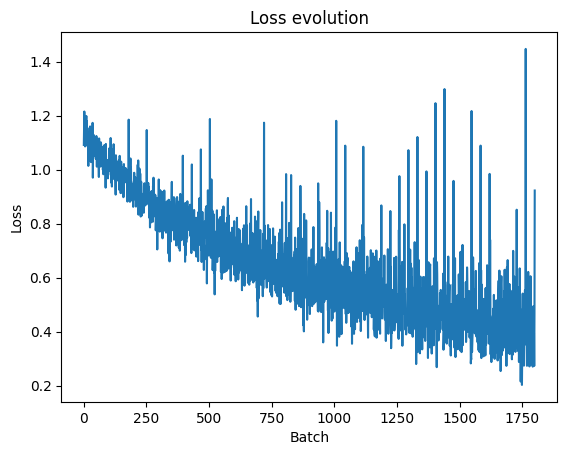

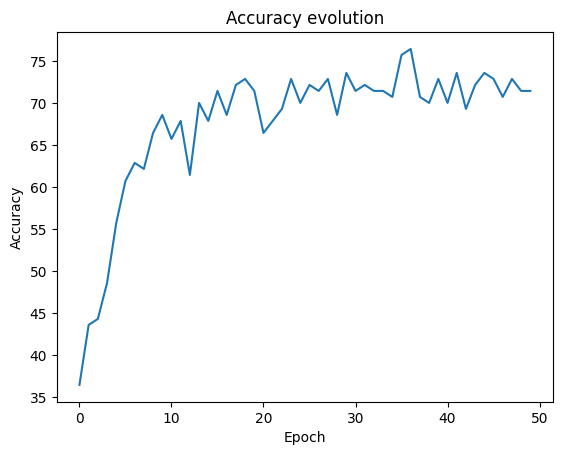

In [23]:
# Plot the loss evolution
plt.plot(loss_evolution)
plt.title('Loss evolution')
plt.xlabel('Batch')
plt.ylabel('Loss')
plt.show()

# Plot the accuracy evolution
plt.plot(accuracy_evolution)
plt.title('Accuracy evolution')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.show()

# Save the model
torch.save(model.state_dict(), 'resnet50_model.pth')

[[30 13  5]
 [ 3 39  9]
 [14  6 22]]
              precision    recall  f1-score   support

     animals       0.64      0.62      0.63        48
       music       0.67      0.76      0.72        51
         sot       0.61      0.52      0.56        42

    accuracy                           0.65       141
   macro avg       0.64      0.64      0.64       141
weighted avg       0.64      0.65      0.64       141



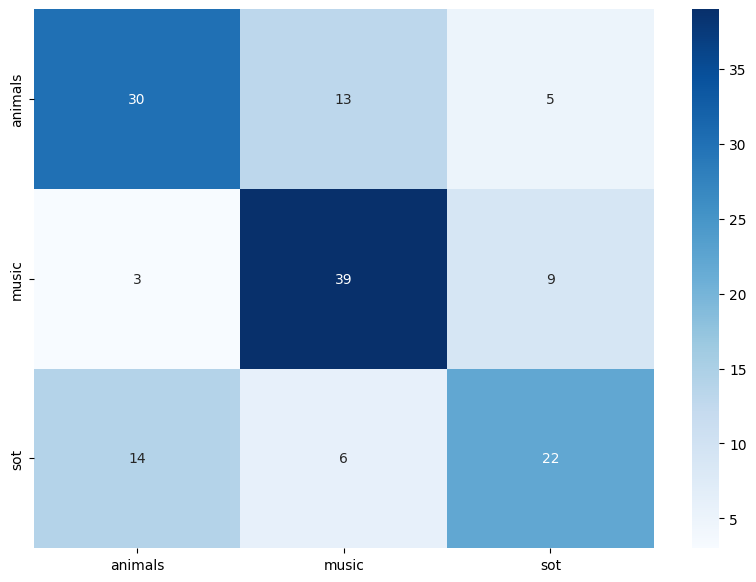

In [24]:
# Confusion matrix


# Get the predictions for the test set
y_pred = []
y_true = []

with torch.no_grad():
    for data in test_dataloader:
        inputs, _, labels = data
        inputs = inputs.cuda()
        inputs = inputs.unsqueeze(1)
        labels = name_tuple_to_float_tensor(labels).cuda()
        labels = labels.long()
        outputs = model(inputs)
        _, predicted = torch.max(outputs.data, 1)
        y_pred += predicted.tolist()
        y_true += labels.tolist()

# Compute and print a pretty confusion matrix
conf_matrix = confusion_matrix(y_true, y_pred)
print(conf_matrix)


# Create a dataframe from the confusion matrix
df_cm = pd.DataFrame(conf_matrix, index = [i for i in ['animals', 'music', 'sot']],
                  columns = [i for i in ['animals', 'music', 'sot']])
plt.figure(figsize = (10,7))
sns.heatmap(df_cm, annot=True, cmap='Blues')

# Print the classification report
print(classification_report(y_true, y_pred, target_names=['animals', 'music', 'sot']))


In [25]:
# Get 1 prediction for the test set with the file paths
dataiter = iter(test_dataloader_with_path)
mfcctensor, sample_rate, classe, file = next(dataiter)
print(mfcctensor.shape, sample_rate, classe, file)

# Get the prediction for the test set
with torch.no_grad():
    inputs = mfcctensor.cuda()
    inputs = inputs.unsqueeze(1)
    outputs = model(inputs)
    
    _, predicted = torch.max(outputs.data, 1)
print("Predicted: ", predicted, "True: ", name_tuple_to_float_tensor(classe).long(), "Class: ", classe)

# Read with ipython.display.Audio
import IPython.display as ipd
import torchaudio 
waveform, sample_rate = torchaudio.load(file[0])
ipd.Audio(waveform, rate=sample_rate)

torch.Size([32, 40, 3001]) tensor([48000, 48000, 48000, 48000, 48000, 48000, 48000, 48000, 48000, 48000,
        48000, 48000, 48000, 48000, 48000, 48000, 48000, 48000, 48000, 48000,
        48000, 48000, 48000, 48000, 48000, 48000, 48000, 48000, 48000, 48000,
        48000, 48000]) ('music', 'music', 'sot', 'music', 'sot', 'music', 'animals', 'music', 'animals', 'sot', 'animals', 'animals', 'sot', 'sot', 'music', 'sot', 'sot', 'music', 'animals', 'animals', 'music', 'music', 'music', 'animals', 'music', 'sot', 'music', 'sot', 'animals', 'music', 'music', 'animals') ('/kaggle/input/trainset/TrainSet/Music/instruments_segmented/YKabP9iNokps.wav', '/kaggle/input/trainset/TrainSet/Music/instruments_segmented/Y7KIn0zojwu8.wav', '/kaggle/input/trainset/TrainSet/SoT/sound_of_things_segmented/Y9ZUzftiN2uw.wav', '/kaggle/input/trainset/TrainSet/Music/instruments_segmented/YFI_Dl0Cmd38.wav', '/kaggle/input/trainset/TrainSet/SoT/sound_of_things_segmented/Y7xwp-c2wefM.wav', '/kaggle/input/trainse

## EFFICIENTNETB0

In [26]:
torch.cuda.empty_cache()

In [27]:
# Load the EfficientNet model (you need to install the effnet_pytorch library)
model_efficientnet = EfficientNet.from_pretrained('efficientnet-b0')
# Modify the first convolution layer to accept 1 channel instead of 3
model_efficientnet._conv_stem = nn.Conv2d(1, 32, kernel_size=3, stride=2, bias=False)
# Modify the fully connected layer for your specific task
model_efficientnet._fc = nn.Linear(model_efficientnet._fc.in_features, num_classes)

model = model_efficientnet
model = nn.DataParallel(model, device_ids=device_ids)
model = model.cuda()

# Define the loss function and the optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model_efficientnet.parameters(), lr=1e-5)

# Training loop
EPOCH = 30

loss_evolution = []
accuracy_evolution = []

for epoch in tqdm.trange(EPOCH):
    running_loss = 0.0
    correct = 0
    total = 0

    for i, data in enumerate(train_dataloader, 0):
        # get the inputs; data is a list of [inputs, labels]
        inputs, _, labels = data
        inputs = inputs.cuda()
        labels = name_tuple_to_float_tensor(labels).cuda()
        labels = labels.long()
        
        # Add a channel dimension to the input
        inputs = inputs.unsqueeze(1)
        
        # zero the parameter gradients
        optimizer.zero_grad()

        # forward + backward + optimize
        outputs = model(inputs)

        loss = criterion(outputs, labels)
        loss_evolution.append(loss.item())
        loss.backward()
        optimizer.step()

        # print statistics
        running_loss += loss.item()

    # Accuracy computation
    with torch.no_grad():
        for data in val_dataloader:
            inputs, _, labels = data
            inputs = inputs.cuda()
            labels = name_tuple_to_float_tensor(labels).cuda()
            labels = labels.long()
            
            inputs = inputs.unsqueeze(1)
            outputs = model(inputs)
            _, predicted = torch.max(outputs.data, 1)
            total += len(labels)
            correct += (predicted == labels).sum().item()

    accuracy_evolution.append(100 * correct / total)
    print('[%d] loss: %.3f | Accuracy: %d %%' % (epoch + 1, running_loss / len(train_dataloader), 100 * correct / total))


Loaded pretrained weights for efficientnet-b0


  3%|▎         | 1/30 [01:00<29:14, 60.48s/it]

[1] loss: 1.066 | Accuracy: 50 %


  7%|▋         | 2/30 [02:00<27:59, 59.97s/it]

[2] loss: 1.036 | Accuracy: 50 %


 10%|█         | 3/30 [02:59<26:56, 59.86s/it]

[3] loss: 1.004 | Accuracy: 53 %


 13%|█▎        | 4/30 [03:59<25:56, 59.86s/it]

[4] loss: 0.968 | Accuracy: 59 %


 17%|█▋        | 5/30 [04:59<24:59, 59.98s/it]

[5] loss: 0.940 | Accuracy: 60 %


 20%|██        | 6/30 [05:59<23:58, 59.93s/it]

[6] loss: 0.910 | Accuracy: 62 %


 23%|██▎       | 7/30 [06:59<22:53, 59.72s/it]

[7] loss: 0.886 | Accuracy: 62 %


 27%|██▋       | 8/30 [07:58<21:55, 59.78s/it]

[8] loss: 0.848 | Accuracy: 63 %


 30%|███       | 9/30 [08:58<20:55, 59.77s/it]

[9] loss: 0.844 | Accuracy: 64 %


 33%|███▎      | 10/30 [09:58<19:55, 59.79s/it]

[10] loss: 0.809 | Accuracy: 72 %


 37%|███▋      | 11/30 [10:58<18:57, 59.87s/it]

[11] loss: 0.799 | Accuracy: 61 %


 40%|████      | 12/30 [11:58<17:56, 59.80s/it]

[12] loss: 0.768 | Accuracy: 67 %


 43%|████▎     | 13/30 [12:57<16:54, 59.66s/it]

[13] loss: 0.761 | Accuracy: 67 %


 47%|████▋     | 14/30 [13:56<15:53, 59.59s/it]

[14] loss: 0.740 | Accuracy: 67 %


 50%|█████     | 15/30 [14:56<14:54, 59.65s/it]

[15] loss: 0.739 | Accuracy: 71 %


 53%|█████▎    | 16/30 [15:56<13:55, 59.67s/it]

[16] loss: 0.697 | Accuracy: 70 %


 57%|█████▋    | 17/30 [16:56<12:56, 59.70s/it]

[17] loss: 0.700 | Accuracy: 72 %


 60%|██████    | 18/30 [17:56<11:57, 59.78s/it]

[18] loss: 0.716 | Accuracy: 72 %


 63%|██████▎   | 19/30 [18:56<10:57, 59.80s/it]

[19] loss: 0.698 | Accuracy: 67 %


 67%|██████▋   | 20/30 [19:56<09:58, 59.90s/it]

[20] loss: 0.661 | Accuracy: 73 %


 70%|███████   | 21/30 [20:56<09:00, 60.02s/it]

[21] loss: 0.656 | Accuracy: 73 %


 73%|███████▎  | 22/30 [21:57<08:03, 60.40s/it]

[22] loss: 0.662 | Accuracy: 71 %


 77%|███████▋  | 23/30 [22:57<07:01, 60.25s/it]

[23] loss: 0.638 | Accuracy: 70 %


 80%|████████  | 24/30 [23:57<06:01, 60.24s/it]

[24] loss: 0.638 | Accuracy: 75 %


 83%|████████▎ | 25/30 [24:57<05:00, 60.14s/it]

[25] loss: 0.612 | Accuracy: 71 %


 87%|████████▋ | 26/30 [25:57<04:00, 60.09s/it]

[26] loss: 0.610 | Accuracy: 73 %


 90%|█████████ | 27/30 [26:57<03:00, 60.01s/it]

[27] loss: 0.585 | Accuracy: 75 %


 93%|█████████▎| 28/30 [27:57<02:00, 60.10s/it]

[28] loss: 0.578 | Accuracy: 70 %


 97%|█████████▋| 29/30 [28:57<00:59, 59.99s/it]

[29] loss: 0.573 | Accuracy: 73 %


100%|██████████| 30/30 [29:58<00:00, 59.94s/it]

[30] loss: 0.549 | Accuracy: 65 %


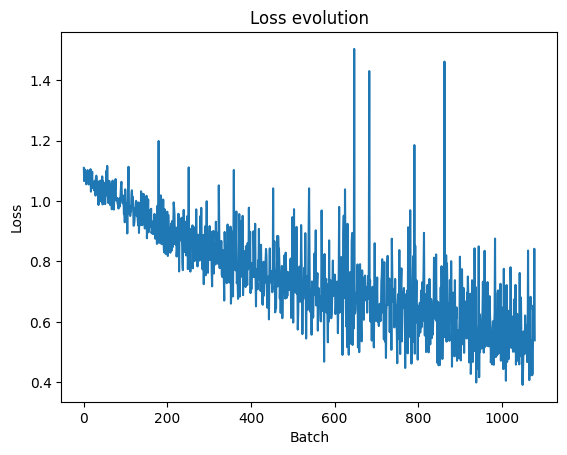

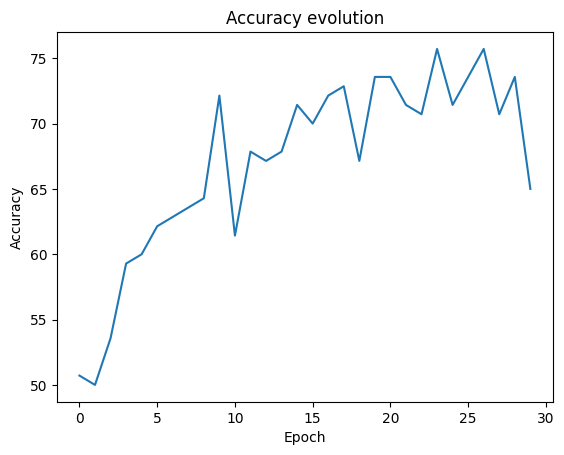

In [28]:
# Plot the loss evolution
plt.plot(loss_evolution)
plt.title('Loss evolution')
plt.xlabel('Batch')
plt.ylabel('Loss')
plt.show()

# Plot the accuracy evolution
plt.plot(accuracy_evolution)
plt.title('Accuracy evolution')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.show()

# Save the model
torch.save(model.state_dict(), 'efficientnet_model.pth')

[[32 11  5]
 [ 3 43  5]
 [15  3 24]]
              precision    recall  f1-score   support

     animals       0.64      0.67      0.65        48
       music       0.75      0.84      0.80        51
         sot       0.71      0.57      0.63        42

    accuracy                           0.70       141
   macro avg       0.70      0.69      0.69       141
weighted avg       0.70      0.70      0.70       141



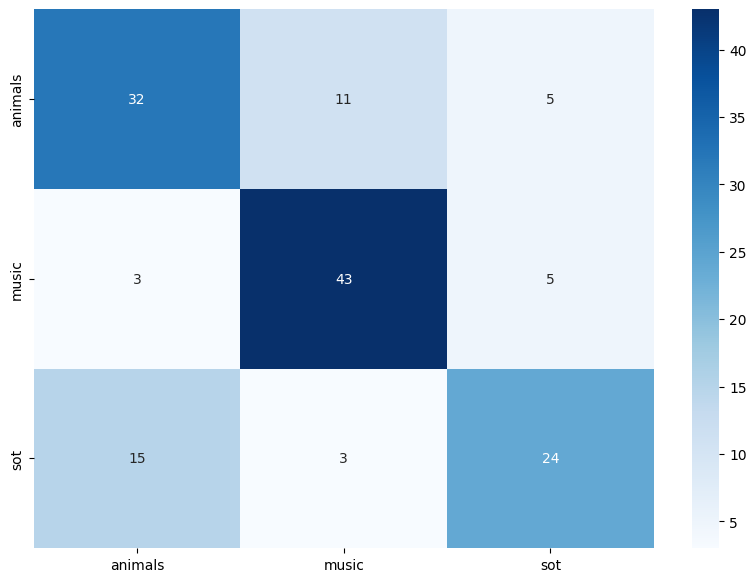

In [29]:
# Confusion matrix


# Get the predictions for the test set
y_pred = []
y_true = []

with torch.no_grad():
    for data in test_dataloader:
        inputs, _, labels = data
        inputs = inputs.cuda()
        inputs = inputs.unsqueeze(1)
        labels = name_tuple_to_float_tensor(labels).cuda()
        labels = labels.long()
        outputs = model(inputs)
        _, predicted = torch.max(outputs.data, 1)
        y_pred += predicted.tolist()
        y_true += labels.tolist()

# Compute and print a pretty confusion matrix
conf_matrix = confusion_matrix(y_true, y_pred)
print(conf_matrix)


# Create a dataframe from the confusion matrix
df_cm = pd.DataFrame(conf_matrix, index = [i for i in ['animals', 'music', 'sot']],
                  columns = [i for i in ['animals', 'music', 'sot']])
plt.figure(figsize = (10,7))
sns.heatmap(df_cm, annot=True, cmap='Blues')

# Print the classification report
print(classification_report(y_true, y_pred, target_names=['animals', 'music', 'sot']))


In [30]:
# Get 1 prediction for the test set with the file paths
dataiter = iter(test_dataloader_with_path)
mfcctensor, sample_rate, classe, file = next(dataiter)
print(mfcctensor.shape, sample_rate, classe, file)

# Get the prediction for the test set
with torch.no_grad():
    inputs = mfcctensor.cuda()
    inputs = inputs.unsqueeze(1)
    outputs = model(inputs)
    _, predicted = torch.max(outputs.data, 1)
print("Predicted: ", predicted, "True: ", name_tuple_to_float_tensor(classe).long(), "Class: ", classe)

# Read with ipython.display.Audio
import IPython.display as ipd
import torchaudio 
waveform, sample_rate = torchaudio.load(file[0])
ipd.Audio(waveform, rate=sample_rate)

torch.Size([32, 40, 3001]) tensor([48000, 48000, 48000, 48000, 48000, 48000, 48000, 48000, 48000, 48000,
        48000, 48000, 48000, 48000, 48000, 48000, 48000, 48000, 48000, 48000,
        48000, 48000, 48000, 48000, 48000, 48000, 48000, 48000, 48000, 48000,
        48000, 48000]) ('animals', 'music', 'music', 'animals', 'animals', 'music', 'sot', 'music', 'music', 'sot', 'sot', 'animals', 'animals', 'music', 'animals', 'music', 'music', 'animals', 'music', 'animals', 'animals', 'sot', 'sot', 'music', 'music', 'music', 'animals', 'sot', 'music', 'music', 'animals', 'animals') ('/kaggle/input/trainset/TrainSet/Animals/animals_segmented/Y0SEHGxAQL18.wav', '/kaggle/input/trainset/TrainSet/Music/instruments_segmented/YLKVSEQCLCLo.wav', '/kaggle/input/trainset/TrainSet/Music/instruments_segmented/YKkqbi6c_40k.wav', '/kaggle/input/trainset/TrainSet/Animals/animals_segmented/YCzXulSbFWPU.wav', '/kaggle/input/trainset/TrainSet/Animals/animals_segmented/YFdmeo7qIDI0.wav', '/kaggle/input/train

## RESNET101

In [31]:
torch.cuda.empty_cache()

In [32]:
from torchvision.models import resnet101
model_resnet101 = resnet101(pretrained=True)

# Modify the first convolution layer to accept 1 channel instead of 3
model_resnet101.conv1 = nn.Conv2d(1, 64, kernel_size=7, stride=2, padding=3, bias=False)

# Modify the fully connected layer for your specific task
model_resnet101.fc = nn.Linear(model_resnet101.fc.in_features, num_classes)

model = model_resnet101
model = nn.DataParallel(model, device_ids=device_ids)
model = model.cuda()

# Define the loss function and the optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=1e-7)

# Training loop
EPOCH = 50

loss_evolution = []
accuracy_evolution = []

for epoch in tqdm.trange(EPOCH):
    running_loss = 0.0
    correct = 0
    total = 0

    for i, data in enumerate(train_dataloader, 0):
        # get the inputs; data is a list of [inputs, labels]
        inputs, _, labels = data
        inputs = inputs.cuda()
        labels = name_tuple_to_float_tensor(labels).cuda()
        labels = labels.long()
        
        # Add a channel dimension to the input
        inputs = inputs.unsqueeze(1)
        
        # zero the parameter gradients
        optimizer.zero_grad()
        

        # forward + backward + optimize
        outputs = model(inputs)

        loss = criterion(outputs, labels)
        loss_evolution.append(loss.item())
        loss.backward()
        optimizer.step()

        # print statistics
        running_loss += loss.item()
        break

    # Accuracy computation
    with torch.no_grad():
        for data in val_dataloader:
            inputs, _, labels = data
            inputs = inputs.cuda()
            labels = name_tuple_to_float_tensor(labels).cuda()
            labels = labels.long()
            
            # Add a channel dimension to the input
            inputs = inputs.unsqueeze(1)
            outputs = model(inputs)
            _, predicted = torch.max(outputs.data, 1)
            total += len(labels)
            correct += (predicted == labels).sum().item()
            break

    accuracy_evolution.append(100 * correct / total)
    print('[%d] loss: %.3f | Accuracy: %d %%' % (epoch + 1, running_loss / len(train_dataloader), 100 * correct / total))

/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet101_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet101_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet101-63fe2227.pth" to /root/.cache/torch/hub/checkpoints/resnet101-63fe2227.pth
100%|██████████| 171M/171M [00:01<00:00, 151MB/s]  
  2%|▏         | 1/50 [00:03<02:53,  3.54s/it]

[1] loss: 0.032 | Accuracy: 18 %


  4%|▍         | 2/50 [00:07<02:48,  3.51s/it]

[2] loss: 0.032 | Accuracy: 34 %


  6%|▌         | 3/50 [00:10<02:44,  3.50s/it]

[3] loss: 0.033 | Accuracy: 31 %


  8%|▊         | 4/50 [00:14<02:43,  3.54s/it]

[4] loss: 0.034 | Accuracy: 40 %


 10%|█         | 5/50 [00:17<02:38,  3.53s/it]

[5] loss: 0.034 | Accuracy: 25 %


 12%|█▏        | 6/50 [00:21<02:33,  3.48s/it]

[6] loss: 0.032 | Accuracy: 25 %


 14%|█▍        | 7/50 [00:24<02:29,  3.49s/it]

[7] loss: 0.031 | Accuracy: 43 %


 16%|█▌        | 8/50 [00:27<02:25,  3.47s/it]

[8] loss: 0.033 | Accuracy: 21 %


 18%|█▊        | 9/50 [00:31<02:23,  3.49s/it]

[9] loss: 0.032 | Accuracy: 21 %


 20%|██        | 10/50 [00:34<02:19,  3.48s/it]

[10] loss: 0.030 | Accuracy: 18 %


 22%|██▏       | 11/50 [00:38<02:15,  3.47s/it]

[11] loss: 0.033 | Accuracy: 28 %


 24%|██▍       | 12/50 [00:41<02:11,  3.47s/it]

[12] loss: 0.032 | Accuracy: 25 %


 26%|██▌       | 13/50 [00:45<02:09,  3.49s/it]

[13] loss: 0.032 | Accuracy: 21 %


 28%|██▊       | 14/50 [00:48<02:05,  3.48s/it]

[14] loss: 0.033 | Accuracy: 21 %


 30%|███       | 15/50 [00:52<02:01,  3.46s/it]

[15] loss: 0.031 | Accuracy: 21 %


 32%|███▏      | 16/50 [00:55<01:58,  3.49s/it]

[16] loss: 0.032 | Accuracy: 25 %


 34%|███▍      | 17/50 [00:59<01:54,  3.47s/it]

[17] loss: 0.034 | Accuracy: 34 %


 36%|███▌      | 18/50 [01:02<01:51,  3.47s/it]

[18] loss: 0.032 | Accuracy: 31 %


 38%|███▊      | 19/50 [01:06<01:48,  3.49s/it]

[19] loss: 0.033 | Accuracy: 40 %


 40%|████      | 20/50 [01:09<01:44,  3.48s/it]

[20] loss: 0.034 | Accuracy: 28 %


 42%|████▏     | 21/50 [01:13<01:40,  3.47s/it]

[21] loss: 0.032 | Accuracy: 25 %


 44%|████▍     | 22/50 [01:16<01:36,  3.46s/it]

[22] loss: 0.032 | Accuracy: 28 %


 46%|████▌     | 23/50 [01:20<01:34,  3.49s/it]

[23] loss: 0.032 | Accuracy: 18 %


 48%|████▊     | 24/50 [01:23<01:30,  3.49s/it]

[24] loss: 0.032 | Accuracy: 34 %


 50%|█████     | 25/50 [01:27<01:27,  3.50s/it]

[25] loss: 0.033 | Accuracy: 28 %


 52%|█████▏    | 26/50 [01:30<01:23,  3.49s/it]

[26] loss: 0.033 | Accuracy: 15 %


 54%|█████▍    | 27/50 [01:34<01:20,  3.51s/it]

[27] loss: 0.034 | Accuracy: 21 %


 56%|█████▌    | 28/50 [01:37<01:16,  3.48s/it]

[28] loss: 0.032 | Accuracy: 28 %


 58%|█████▊    | 29/50 [01:41<01:13,  3.48s/it]

[29] loss: 0.030 | Accuracy: 21 %


 60%|██████    | 30/50 [01:44<01:09,  3.49s/it]

[30] loss: 0.034 | Accuracy: 25 %


 62%|██████▏   | 31/50 [01:48<01:06,  3.49s/it]

[31] loss: 0.032 | Accuracy: 21 %


 64%|██████▍   | 32/50 [01:51<01:02,  3.49s/it]

[32] loss: 0.033 | Accuracy: 31 %


 66%|██████▌   | 33/50 [01:55<00:59,  3.48s/it]

[33] loss: 0.032 | Accuracy: 37 %


 68%|██████▊   | 34/50 [01:58<00:55,  3.48s/it]

[34] loss: 0.031 | Accuracy: 50 %


 70%|███████   | 35/50 [02:01<00:52,  3.47s/it]

[35] loss: 0.035 | Accuracy: 25 %


 72%|███████▏  | 36/50 [02:05<00:49,  3.50s/it]

[36] loss: 0.032 | Accuracy: 6 %


 74%|███████▍  | 37/50 [02:09<00:45,  3.50s/it]

[37] loss: 0.033 | Accuracy: 18 %


 76%|███████▌  | 38/50 [02:12<00:41,  3.48s/it]

[38] loss: 0.033 | Accuracy: 28 %


 78%|███████▊  | 39/50 [02:15<00:38,  3.48s/it]

[39] loss: 0.034 | Accuracy: 31 %


 80%|████████  | 40/50 [02:19<00:34,  3.48s/it]

[40] loss: 0.033 | Accuracy: 12 %


 82%|████████▏ | 41/50 [02:22<00:31,  3.48s/it]

[41] loss: 0.033 | Accuracy: 12 %


 84%|████████▍ | 42/50 [02:26<00:27,  3.49s/it]

[42] loss: 0.032 | Accuracy: 31 %


 86%|████████▌ | 43/50 [02:29<00:24,  3.48s/it]

[43] loss: 0.032 | Accuracy: 34 %


 88%|████████▊ | 44/50 [02:33<00:20,  3.47s/it]

[44] loss: 0.033 | Accuracy: 21 %


 90%|█████████ | 45/50 [02:36<00:17,  3.49s/it]

[45] loss: 0.030 | Accuracy: 21 %


 92%|█████████▏| 46/50 [02:40<00:14,  3.53s/it]

[46] loss: 0.031 | Accuracy: 15 %


 94%|█████████▍| 47/50 [02:44<00:10,  3.54s/it]

[47] loss: 0.031 | Accuracy: 37 %


 96%|█████████▌| 48/50 [02:47<00:07,  3.52s/it]

[48] loss: 0.031 | Accuracy: 31 %


 98%|█████████▊| 49/50 [02:50<00:03,  3.51s/it]

[49] loss: 0.035 | Accuracy: 37 %


100%|██████████| 50/50 [02:54<00:00,  3.49s/it]

[50] loss: 0.031 | Accuracy: 34 %


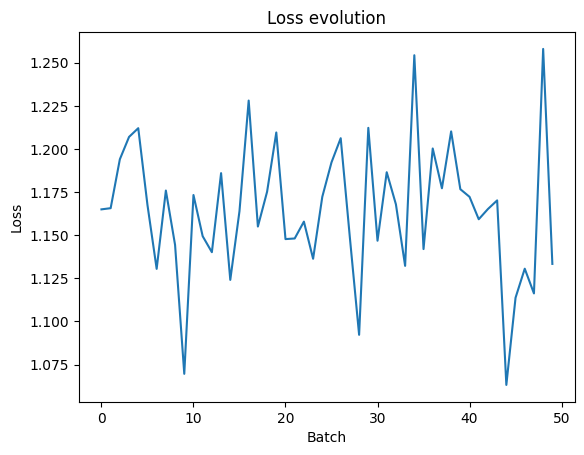

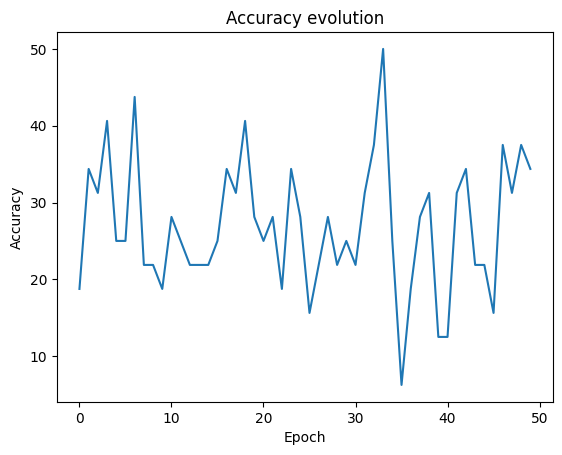

In [33]:
# Plot the loss evolution
plt.plot(loss_evolution)
plt.title('Loss evolution')
plt.xlabel('Batch')
plt.ylabel('Loss')
plt.show()

# Plot the accuracy evolution
plt.plot(accuracy_evolution)
plt.title('Accuracy evolution')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.show()

# Save the model
torch.save(model.state_dict(), 'resnet101_model.pth')

[[26  3 19]
 [30  3 18]
 [29  0 13]]
              precision    recall  f1-score   support

     animals       0.31      0.54      0.39        48
       music       0.50      0.06      0.11        51
         sot       0.26      0.31      0.28        42

    accuracy                           0.30       141
   macro avg       0.36      0.30      0.26       141
weighted avg       0.36      0.30      0.26       141



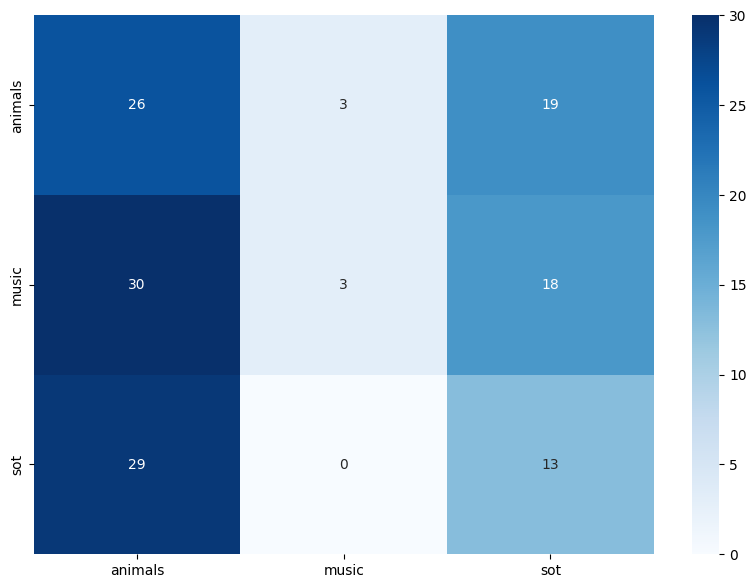

In [34]:
# Confusion matrix


# Get the predictions for the test set
y_pred = []
y_true = []

with torch.no_grad():
    for data in test_dataloader:
        inputs, _, labels = data
        inputs = inputs.cuda()
        inputs = inputs.unsqueeze(1)
        labels = name_tuple_to_float_tensor(labels).cuda()
        labels = labels.long()
        outputs = model(inputs)
        _, predicted = torch.max(outputs.data, 1)
        y_pred += predicted.tolist()
        y_true += labels.tolist()

# Compute and print a pretty confusion matrix
conf_matrix = confusion_matrix(y_true, y_pred)
print(conf_matrix)


# Create a dataframe from the confusion matrix
df_cm = pd.DataFrame(conf_matrix, index = [i for i in ['animals', 'music', 'sot']],
                  columns = [i for i in ['animals', 'music', 'sot']])
plt.figure(figsize = (10,7))
sns.heatmap(df_cm, annot=True, cmap='Blues')

# Print the classification report
print(classification_report(y_true, y_pred, target_names=['animals', 'music', 'sot']))


In [35]:
# Get 1 prediction for the test set with the file paths
dataiter = iter(test_dataloader_with_path)
mfcctensor, sample_rate, classe, file = next(dataiter)
print(mfcctensor.shape, sample_rate, classe, file)

# Get the prediction for the test set
with torch.no_grad():
    inputs = mfcctensor.cuda()
    inputs = inputs.unsqueeze(1)
    outputs = model(inputs)
    _, predicted = torch.max(outputs.data, 1)
print("Predicted: ", predicted, "True: ", name_tuple_to_float_tensor(classe).long(), "Class: ", classe)

# Read with ipython.display.Audio
import IPython.display as ipd
import torchaudio 
waveform, sample_rate = torchaudio.load(file[0])
ipd.Audio(waveform, rate=sample_rate)

torch.Size([32, 40, 3001]) tensor([48000, 48000, 48000, 48000, 48000, 48000, 48000, 48000, 48000, 48000,
        48000, 48000, 48000, 48000, 48000, 48000, 48000, 48000, 48000, 48000,
        48000, 48000, 48000, 48000, 48000, 48000, 48000, 48000, 48000, 48000,
        48000, 48000]) ('music', 'sot', 'music', 'sot', 'animals', 'music', 'sot', 'music', 'animals', 'music', 'animals', 'sot', 'music', 'sot', 'sot', 'music', 'sot', 'animals', 'sot', 'music', 'music', 'sot', 'music', 'sot', 'sot', 'music', 'sot', 'music', 'music', 'sot', 'music', 'sot') ('/kaggle/input/trainset/TrainSet/Music/instruments_segmented/YEieK70X8lnw.wav', '/kaggle/input/trainset/TrainSet/SoT/sound_of_things_segmented/Y70zkNgxb-gs.wav', '/kaggle/input/trainset/TrainSet/Music/instruments_segmented/Y6Tf5IwOHBlw.wav', '/kaggle/input/trainset/TrainSet/SoT/sound_of_things_segmented/Y0O9ZfRn69i8.wav', '/kaggle/input/trainset/TrainSet/Animals/animals_segmented/YPL273lApLw4.wav', '/kaggle/input/trainset/TrainSet/Music/instr

## VGG16:

In [36]:
torch.cuda.empty_cache()

In [37]:
from torchvision.models import vgg16
model_vgg16 = vgg16(pretrained=True)

# Modify the first convolution layer to accept 1 channel instead of 3
model_vgg16.features[0] = nn.Conv2d(1, 64, kernel_size=3, stride=1, padding=1)

# Modify the fully connected layer for your specific task
model_vgg16.classifier[6] = nn.Linear(model_vgg16.classifier[6].in_features, num_classes)

model = model_vgg16
model = nn.DataParallel(model, device_ids=device_ids)
model = model.cuda()

# Define the loss function and the optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=1e-5)

# Training loop
EPOCH = 40

loss_evolution = []
accuracy_evolution = []

for epoch in tqdm.trange(EPOCH):
    running_loss = 0.0
    correct = 0
    total = 0

    for i, data in enumerate(train_dataloader, 0):
        # get the inputs; data is a list of [inputs, labels]
        inputs, _, labels = data
        inputs = inputs.cuda()
        labels = name_tuple_to_float_tensor(labels).cuda()
        labels = labels.long()
        
        # Add a channel dimension to the input
        inputs = inputs.unsqueeze(1)
        
        # zero the parameter gradients
        optimizer.zero_grad()
        

        # forward + backward + optimize
        outputs = model(inputs)

        loss = criterion(outputs, labels)
        loss_evolution.append(loss.item())
        loss.backward()
        optimizer.step()

        # print statistics
        running_loss += loss.item()
        break

    # Accuracy computation
    with torch.no_grad():
        for data in val_dataloader:
            inputs, _, labels = data
            inputs = inputs.cuda()
            labels = name_tuple_to_float_tensor(labels).cuda()
            labels = labels.long()          
            
            # Add a channel dimension to the input
            inputs = inputs.unsqueeze(1)
        
            outputs = model(inputs)
            _, predicted = torch.max(outputs.data, 1)
            total += len(labels)
            correct += (predicted == labels).sum().item()
            break

    accuracy_evolution.append(100 * correct / total)
    print('[%d] loss: %.3f | Accuracy: %d %%' % (epoch + 1, running_loss / len(train_dataloader), 100 * correct / total))

/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to /root/.cache/torch/hub/checkpoints/vgg16-397923af.pth
100%|██████████| 528M/528M [00:03<00:00, 163MB/s]  
  2%|▎         | 1/40 [00:03<02:22,  3.66s/it]

[1] loss: 0.082 | Accuracy: 34 %


  5%|▌         | 2/40 [00:07<02:17,  3.62s/it]

[2] loss: 0.055 | Accuracy: 43 %


  8%|▊         | 3/40 [00:10<02:13,  3.62s/it]

[3] loss: 0.049 | Accuracy: 28 %


 10%|█         | 4/40 [00:14<02:09,  3.59s/it]

[4] loss: 0.042 | Accuracy: 34 %


 12%|█▎        | 5/40 [00:17<02:04,  3.56s/it]

[5] loss: 0.044 | Accuracy: 34 %


 15%|█▌        | 6/40 [00:21<02:00,  3.55s/it]

[6] loss: 0.054 | Accuracy: 31 %


 18%|█▊        | 7/40 [00:24<01:56,  3.54s/it]

[7] loss: 0.043 | Accuracy: 28 %


 20%|██        | 8/40 [00:28<01:54,  3.58s/it]

[8] loss: 0.046 | Accuracy: 28 %


 22%|██▎       | 9/40 [00:32<01:50,  3.58s/it]

[9] loss: 0.027 | Accuracy: 25 %


 25%|██▌       | 10/40 [00:35<01:46,  3.56s/it]

[10] loss: 0.033 | Accuracy: 21 %


 28%|██▊       | 11/40 [00:39<01:43,  3.55s/it]

[11] loss: 0.030 | Accuracy: 37 %


 30%|███       | 12/40 [00:42<01:39,  3.56s/it]

[12] loss: 0.038 | Accuracy: 31 %


 32%|███▎      | 13/40 [00:46<01:36,  3.57s/it]

[13] loss: 0.034 | Accuracy: 31 %


 35%|███▌      | 14/40 [00:49<01:32,  3.55s/it]

[14] loss: 0.029 | Accuracy: 40 %


 38%|███▊      | 15/40 [00:53<01:29,  3.59s/it]

[15] loss: 0.034 | Accuracy: 31 %


 40%|████      | 16/40 [00:57<01:26,  3.59s/it]

[16] loss: 0.033 | Accuracy: 21 %


 42%|████▎     | 17/40 [01:00<01:22,  3.59s/it]

[17] loss: 0.039 | Accuracy: 28 %


 45%|████▌     | 18/40 [01:04<01:18,  3.59s/it]

[18] loss: 0.033 | Accuracy: 43 %


 48%|████▊     | 19/40 [01:07<01:14,  3.56s/it]

[19] loss: 0.033 | Accuracy: 25 %


 50%|█████     | 20/40 [01:11<01:11,  3.56s/it]

[20] loss: 0.029 | Accuracy: 34 %


 52%|█████▎    | 21/40 [01:14<01:07,  3.55s/it]

[21] loss: 0.034 | Accuracy: 28 %


 55%|█████▌    | 22/40 [01:18<01:03,  3.53s/it]

[22] loss: 0.034 | Accuracy: 28 %


 57%|█████▊    | 23/40 [01:22<01:00,  3.53s/it]

[23] loss: 0.022 | Accuracy: 31 %


 60%|██████    | 24/40 [01:25<00:56,  3.52s/it]

[24] loss: 0.030 | Accuracy: 53 %


 62%|██████▎   | 25/40 [01:29<00:52,  3.53s/it]

[25] loss: 0.034 | Accuracy: 53 %


 65%|██████▌   | 26/40 [01:32<00:49,  3.57s/it]

[26] loss: 0.038 | Accuracy: 34 %


 68%|██████▊   | 27/40 [01:36<00:46,  3.58s/it]

[27] loss: 0.030 | Accuracy: 53 %


 70%|███████   | 28/40 [01:39<00:42,  3.57s/it]

[28] loss: 0.033 | Accuracy: 50 %


 72%|███████▎  | 29/40 [01:43<00:39,  3.57s/it]

[29] loss: 0.028 | Accuracy: 40 %


 75%|███████▌  | 30/40 [01:46<00:35,  3.56s/it]

[30] loss: 0.027 | Accuracy: 46 %


 78%|███████▊  | 31/40 [01:50<00:31,  3.54s/it]

[31] loss: 0.033 | Accuracy: 53 %


 80%|████████  | 32/40 [01:54<00:28,  3.57s/it]

[32] loss: 0.030 | Accuracy: 53 %


 82%|████████▎ | 33/40 [01:57<00:25,  3.57s/it]

[33] loss: 0.031 | Accuracy: 28 %


 85%|████████▌ | 34/40 [02:01<00:21,  3.56s/it]

[34] loss: 0.029 | Accuracy: 46 %


 88%|████████▊ | 35/40 [02:04<00:18,  3.61s/it]

[35] loss: 0.032 | Accuracy: 43 %


 90%|█████████ | 36/40 [02:08<00:14,  3.60s/it]

[36] loss: 0.029 | Accuracy: 31 %


 92%|█████████▎| 37/40 [02:12<00:10,  3.58s/it]

[37] loss: 0.030 | Accuracy: 34 %


 95%|█████████▌| 38/40 [02:15<00:07,  3.57s/it]

[38] loss: 0.035 | Accuracy: 31 %


 98%|█████████▊| 39/40 [02:19<00:03,  3.55s/it]

[39] loss: 0.028 | Accuracy: 53 %


100%|██████████| 40/40 [02:22<00:00,  3.57s/it]

[40] loss: 0.027 | Accuracy: 43 %


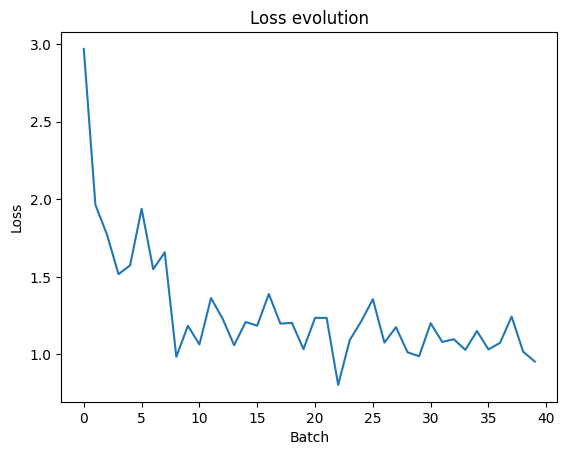

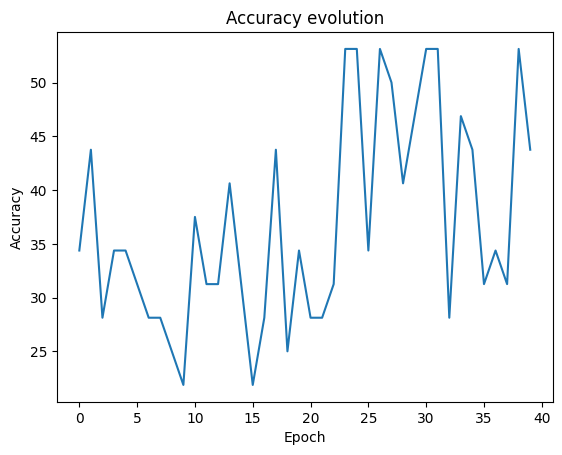

In [38]:
# Plot the loss evolution
plt.plot(loss_evolution)
plt.title('Loss evolution')
plt.xlabel('Batch')
plt.ylabel('Loss')
plt.show()

# Plot the accuracy evolution
plt.plot(accuracy_evolution)
plt.title('Accuracy evolution')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.show()

# Save the model
torch.save(model.state_dict(), 'resnet101_model.pth')

[[16 23  9]
 [ 6 28 17]
 [ 6 17 19]]
              precision    recall  f1-score   support

     animals       0.57      0.33      0.42        48
       music       0.41      0.55      0.47        51
         sot       0.42      0.45      0.44        42

    accuracy                           0.45       141
   macro avg       0.47      0.44      0.44       141
weighted avg       0.47      0.45      0.44       141



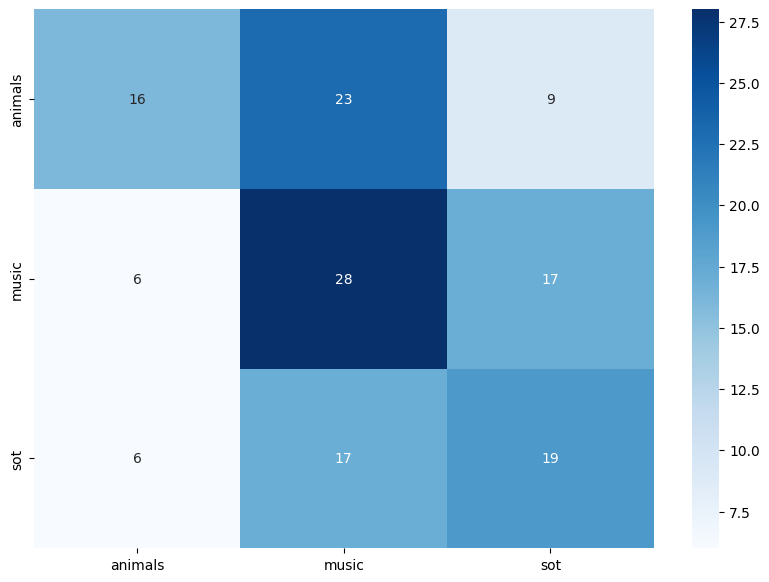

In [39]:
# Confusion matrix


# Get the predictions for the test set
y_pred = []
y_true = []

with torch.no_grad():
    for data in test_dataloader:
        inputs, _, labels = data
        inputs = inputs.cuda()
        inputs = inputs.unsqueeze(1)
        labels = name_tuple_to_float_tensor(labels).cuda()
        labels = labels.long()
        outputs = model(inputs)
        _, predicted = torch.max(outputs.data, 1)
        y_pred += predicted.tolist()
        y_true += labels.tolist()

# Compute and print a pretty confusion matrix
conf_matrix = confusion_matrix(y_true, y_pred)
print(conf_matrix)


# Create a dataframe from the confusion matrix
df_cm = pd.DataFrame(conf_matrix, index = [i for i in ['animals', 'music', 'sot']],
                  columns = [i for i in ['animals', 'music', 'sot']])
plt.figure(figsize = (10,7))
sns.heatmap(df_cm, annot=True, cmap='Blues')

# Print the classification report
print(classification_report(y_true, y_pred, target_names=['animals', 'music', 'sot']))


In [40]:
# Get 1 prediction for the test set with the file paths
dataiter = iter(test_dataloader_with_path)
mfcctensor, sample_rate, classe, file = next(dataiter)
print(mfcctensor.shape, sample_rate, classe, file)

# Get the prediction for the test set
with torch.no_grad():
    inputs = mfcctensor.cuda()
    inputs = inputs.unsqueeze(1)
    outputs = model(inputs)
    _, predicted = torch.max(outputs.data, 1)
print("Predicted: ", predicted, "True: ", name_tuple_to_float_tensor(classe).long(), "Class: ", classe)

# Read with ipython.display.Audio
import IPython.display as ipd
import torchaudio 
waveform, sample_rate = torchaudio.load(file[0])
ipd.Audio(waveform, rate=sample_rate)

torch.Size([32, 40, 3001]) tensor([48000, 48000, 48000, 48000, 48000, 48000, 48000, 48000, 48000, 48000,
        48000, 48000, 48000, 48000, 48000, 48000, 48000, 48000, 48000, 48000,
        48000, 48000, 48000, 48000, 48000, 48000, 48000, 48000, 48000, 48000,
        48000, 48000]) ('music', 'music', 'music', 'music', 'sot', 'sot', 'music', 'music', 'animals', 'animals', 'music', 'sot', 'animals', 'animals', 'sot', 'animals', 'music', 'animals', 'animals', 'music', 'animals', 'sot', 'sot', 'music', 'sot', 'sot', 'music', 'music', 'animals', 'animals', 'sot', 'music') ('/kaggle/input/trainset/TrainSet/Music/instruments_segmented/Y3TP1itJqv-E.wav', '/kaggle/input/trainset/TrainSet/Music/instruments_segmented/Y6lPw0wKu7_M.wav', '/kaggle/input/trainset/TrainSet/Music/instruments_segmented/Y-0SdAVK79lg.wav', '/kaggle/input/trainset/TrainSet/Music/instruments_segmented/YDu3Q6NdsSso.wav', '/kaggle/input/trainset/TrainSet/SoT/sound_of_things_segmented/YJP0_mYPJJI8.wav', '/kaggle/input/trainse

## Densenet 121

In [41]:
torch.cuda.empty_cache()

In [42]:
from torchvision.models import densenet121
model_densenet121 = densenet121(pretrained=True)

# Modify the first convolution layer to accept 1 channel instead of 3
model_densenet121.features.conv0 = nn.Conv2d(1, 64, kernel_size=7, stride=2, padding=3, bias=False)

# Modify the fully connected layer for your specific task
model_densenet121.classifier = nn.Linear(model_densenet121.classifier.in_features, num_classes)

model = model_densenet121
model = nn.DataParallel(model, device_ids=device_ids)
model = model.cuda()

# Define the loss function and the optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=1e-4)

# Training loop
EPOCH = 25

loss_evolution = []
accuracy_evolution = []

for epoch in tqdm.trange(EPOCH):
    running_loss = 0.0
    correct = 0
    total = 0

    for i, data in enumerate(train_dataloader, 0):
        # get the inputs; data is a list of [inputs, labels]
        inputs, _, labels = data
        inputs = inputs.cuda()
        
        labels = name_tuple_to_float_tensor(labels).cuda()
        labels = labels.long()
        
        # Add a channel dimension to the input
        inputs = inputs.unsqueeze(1)
        
        # zero the parameter gradients
        optimizer.zero_grad()
        

        # forward + backward + optimize
        outputs = model(inputs)

        loss = criterion(outputs, labels)
        loss_evolution.append(loss.item())
        loss.backward()
        optimizer.step()

        # print statistics
        running_loss += loss.item()
        break

    # Accuracy computation
    with torch.no_grad():
        for data in val_dataloader:
            inputs, _, labels = data
            inputs = inputs.cuda()
            labels = name_tuple_to_float_tensor(labels).cuda()
            labels = labels.long()
            
            # Add a channel dimension to the input
            inputs = inputs.unsqueeze(1)
        
            outputs = model(inputs)
            _, predicted = torch.max(outputs.data, 1)
            total += len(labels)
            correct += (predicted == labels).sum().item()
            break

    accuracy_evolution.append(100 * correct / total)
    print('[%d] loss: %.3f | Accuracy: %d %%' % (epoch + 1, running_loss / len(train_dataloader), 100 * correct / total))

/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/densenet121-a639ec97.pth" to /root/.cache/torch/hub/checkpoints/densenet121-a639ec97.pth
100%|██████████| 30.8M/30.8M [00:00<00:00, 129MB/s] 
  4%|▍         | 1/25 [00:03<01:17,  3.22s/it]

[1] loss: 0.029 | Accuracy: 40 %


  8%|▊         | 2/25 [00:06<01:13,  3.22s/it]

[2] loss: 0.031 | Accuracy: 37 %


 12%|█▏        | 3/25 [00:09<01:10,  3.20s/it]

[3] loss: 0.028 | Accuracy: 37 %


 16%|█▌        | 4/25 [00:12<01:06,  3.17s/it]

[4] loss: 0.028 | Accuracy: 53 %


 20%|██        | 5/25 [00:15<01:02,  3.14s/it]

[5] loss: 0.028 | Accuracy: 53 %


 24%|██▍       | 6/25 [00:18<00:59,  3.13s/it]

[6] loss: 0.025 | Accuracy: 56 %


 28%|██▊       | 7/25 [00:22<00:56,  3.13s/it]

[7] loss: 0.027 | Accuracy: 62 %


 32%|███▏      | 8/25 [00:25<00:53,  3.13s/it]

[8] loss: 0.026 | Accuracy: 56 %


 36%|███▌      | 9/25 [00:28<00:50,  3.14s/it]

[9] loss: 0.023 | Accuracy: 68 %


 40%|████      | 10/25 [00:31<00:48,  3.26s/it]

[10] loss: 0.022 | Accuracy: 71 %


 44%|████▍     | 11/25 [00:35<00:45,  3.22s/it]

[11] loss: 0.027 | Accuracy: 68 %


 48%|████▊     | 12/25 [00:38<00:42,  3.24s/it]

[12] loss: 0.023 | Accuracy: 59 %


 52%|█████▏    | 13/25 [00:41<00:38,  3.22s/it]

[13] loss: 0.018 | Accuracy: 53 %


 56%|█████▌    | 14/25 [00:44<00:35,  3.19s/it]

[14] loss: 0.023 | Accuracy: 53 %


 60%|██████    | 15/25 [00:47<00:31,  3.19s/it]

[15] loss: 0.021 | Accuracy: 62 %


 64%|██████▍   | 16/25 [00:50<00:28,  3.19s/it]

[16] loss: 0.024 | Accuracy: 71 %


 68%|██████▊   | 17/25 [00:54<00:25,  3.17s/it]

[17] loss: 0.016 | Accuracy: 68 %


 72%|███████▏  | 18/25 [00:57<00:22,  3.16s/it]

[18] loss: 0.018 | Accuracy: 65 %


 76%|███████▌  | 19/25 [01:00<00:18,  3.17s/it]

[19] loss: 0.018 | Accuracy: 62 %


 80%|████████  | 20/25 [01:03<00:16,  3.25s/it]

[20] loss: 0.020 | Accuracy: 71 %


 84%|████████▍ | 21/25 [01:07<00:13,  3.27s/it]

[21] loss: 0.021 | Accuracy: 71 %


 88%|████████▊ | 22/25 [01:10<00:09,  3.26s/it]

[22] loss: 0.020 | Accuracy: 59 %


 92%|█████████▏| 23/25 [01:13<00:06,  3.23s/it]

[23] loss: 0.015 | Accuracy: 75 %


 96%|█████████▌| 24/25 [01:16<00:03,  3.21s/it]

[24] loss: 0.024 | Accuracy: 78 %


100%|██████████| 25/25 [01:20<00:00,  3.20s/it]

[25] loss: 0.016 | Accuracy: 62 %


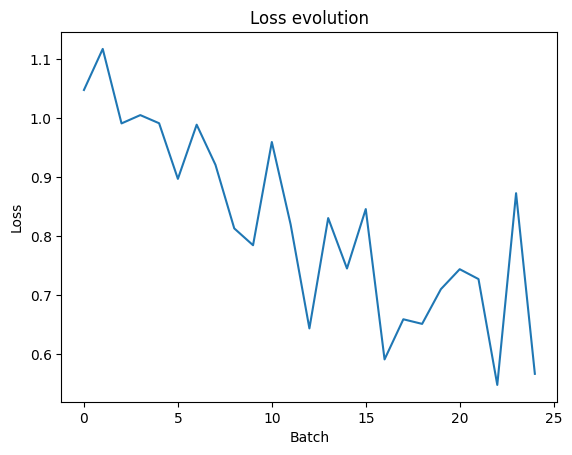

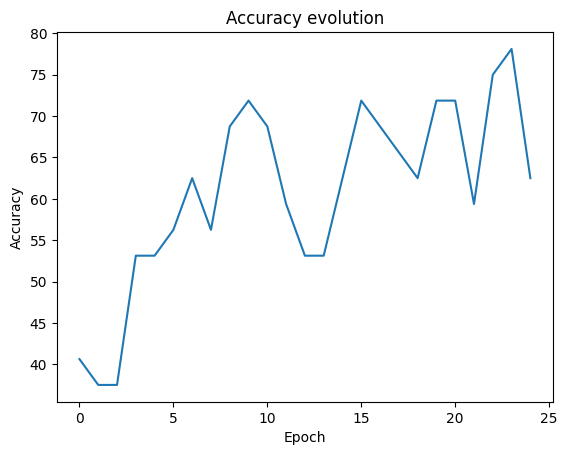

In [43]:
# Plot the loss evolution
plt.plot(loss_evolution)
plt.title('Loss evolution')
plt.xlabel('Batch')
plt.ylabel('Loss')
plt.show()

# Plot the accuracy evolution
plt.plot(accuracy_evolution)
plt.title('Accuracy evolution')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.show()

# Save the model
torch.save(model.state_dict(), 'resnet101_model.pth')

[[26 11 11]
 [ 2 36 13]
 [13  5 24]]
              precision    recall  f1-score   support

     animals       0.63      0.54      0.58        48
       music       0.69      0.71      0.70        51
         sot       0.50      0.57      0.53        42

    accuracy                           0.61       141
   macro avg       0.61      0.61      0.61       141
weighted avg       0.62      0.61      0.61       141



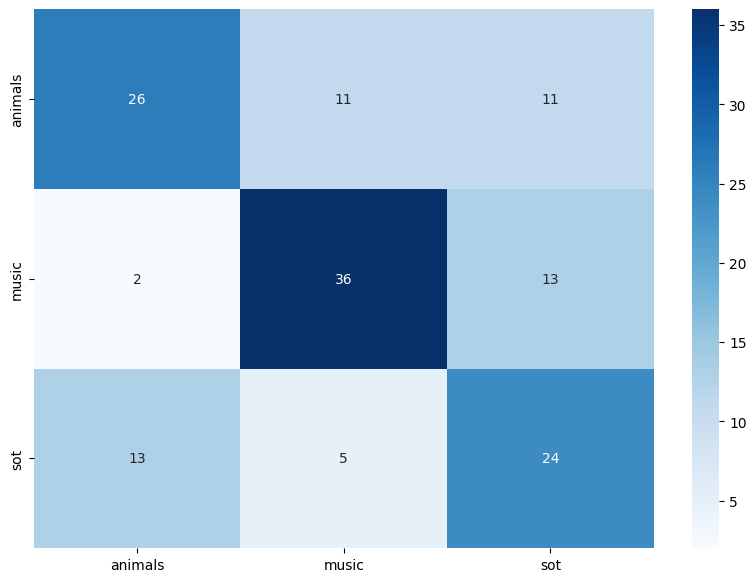

In [44]:
# Confusion matrix


# Get the predictions for the test set
y_pred = []
y_true = []

with torch.no_grad():
    for data in test_dataloader:
        inputs, _, labels = data
        inputs = inputs.cuda()
        inputs = inputs.unsqueeze(1)
        labels = name_tuple_to_float_tensor(labels).cuda()
        labels = labels.long()
        outputs = model(inputs)
        _, predicted = torch.max(outputs.data, 1)
        y_pred += predicted.tolist()
        y_true += labels.tolist()

# Compute and print a pretty confusion matrix
conf_matrix = confusion_matrix(y_true, y_pred)
print(conf_matrix)


# Create a dataframe from the confusion matrix
df_cm = pd.DataFrame(conf_matrix, index = [i for i in ['animals', 'music', 'sot']],
                  columns = [i for i in ['animals', 'music', 'sot']])
plt.figure(figsize = (10,7))
sns.heatmap(df_cm, annot=True, cmap='Blues')

# Print the classification report
print(classification_report(y_true, y_pred, target_names=['animals', 'music', 'sot']))


In [45]:
# Get 1 prediction for the test set with the file paths
dataiter = iter(test_dataloader_with_path)
mfcctensor, sample_rate, classe, file = next(dataiter)
print(mfcctensor.shape, sample_rate, classe, file)

# Get the prediction for the test set
with torch.no_grad():
    inputs = mfcctensor.cuda()
    inputs = inputs.unsqueeze(1)
    outputs = model(inputs)
    _, predicted = torch.max(outputs.data, 1)
print("Predicted: ", predicted, "True: ", name_tuple_to_float_tensor(classe).long(), "Class: ", classe)

# Read with ipython.display.Audio
import IPython.display as ipd
import torchaudio 
waveform, sample_rate = torchaudio.load(file[0])
ipd.Audio(waveform, rate=sample_rate)

torch.Size([32, 40, 3001]) tensor([48000, 48000, 48000, 48000, 48000, 48000, 48000, 48000, 48000, 48000,
        48000, 48000, 48000, 48000, 48000, 48000, 48000, 48000, 48000, 48000,
        48000, 48000, 48000, 48000, 48000, 48000, 48000, 48000, 48000, 48000,
        48000, 48000]) ('sot', 'animals', 'music', 'music', 'sot', 'music', 'animals', 'sot', 'music', 'animals', 'music', 'music', 'sot', 'sot', 'music', 'sot', 'music', 'sot', 'music', 'music', 'animals', 'music', 'sot', 'sot', 'animals', 'animals', 'sot', 'animals', 'sot', 'animals', 'sot', 'sot') ('/kaggle/input/trainset/TrainSet/SoT/sound_of_things_segmented/Y6j76kSyiOCA.wav', '/kaggle/input/trainset/TrainSet/Animals/animals_segmented/YKZXC1iouJyo.wav', '/kaggle/input/trainset/TrainSet/Music/instruments_segmented/Y9m0tNvskmTc.wav', '/kaggle/input/trainset/TrainSet/Music/instruments_segmented/YAkg1n9IWSrw.wav', '/kaggle/input/trainset/TrainSet/SoT/sound_of_things_segmented/Y1p2-GaPCoI4.wav', '/kaggle/input/trainset/TrainSet/M

## MobileNetV2

In [46]:
torch.cuda.empty_cache()

In [47]:
from torchvision.models import mobilenet_v2
model_mobilenetv2 = mobilenet_v2(pretrained=True)

# Modify the first convolution layer to accept 1 channel instead of 3
model_mobilenetv2.features[0][0] = nn.Conv2d(1, 32, kernel_size=3, stride=2, padding=1, bias=False)

# Modify the fully connected layer for your specific task
model_mobilenetv2.classifier[1] = nn.Linear(model_mobilenetv2.classifier[1].in_features, num_classes)

model = model_mobilenetv2
model = nn.DataParallel(model, device_ids=device_ids)
model = model.cuda()

# Define the loss function and the optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=1e-4)

# Training loop
EPOCH = 25

loss_evolution = []
accuracy_evolution = []

for epoch in tqdm.trange(EPOCH):
    running_loss = 0.0
    correct = 0
    total = 0

    for i, data in enumerate(train_dataloader, 0):
        # get the inputs; data is a list of [inputs, labels]
        inputs, _, labels = data
        inputs = inputs.cuda()
        labels = name_tuple_to_float_tensor(labels).cuda()
        labels = labels.long()
        
        # Add a channel dimension to the input
        inputs = inputs.unsqueeze(1)
        
        # zero the parameter gradients
        optimizer.zero_grad()
        

        # forward + backward + optimize
        outputs = model(inputs)

        loss = criterion(outputs, labels)
        loss_evolution.append(loss.item())
        loss.backward()
        optimizer.step()

        # print statistics
        running_loss += loss.item()
        break

    # Accuracy computation
    with torch.no_grad():
        for data in val_dataloader:
            inputs, _, labels = data
            inputs = inputs.cuda()
            labels = name_tuple_to_float_tensor(labels).cuda()
            labels = labels.long()
            
            # Add a channel dimension to the input
            inputs = inputs.unsqueeze(1)
            outputs = model(inputs)
            _, predicted = torch.max(outputs.data, 1)
            total += len(labels)
            correct += (predicted == labels).sum().item()
            break

    accuracy_evolution.append(100 * correct / total)
    print('[%d] loss: %.3f | Accuracy: %d %%' % (epoch + 1, running_loss / len(train_dataloader), 100 * correct / total))

/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=MobileNet_V2_Weights.IMAGENET1K_V1`. You can also use `weights=MobileNet_V2_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/mobilenet_v2-b0353104.pth" to /root/.cache/torch/hub/checkpoints/mobilenet_v2-b0353104.pth
100%|██████████| 13.6M/13.6M [00:00<00:00, 88.6MB/s]
  4%|▍         | 1/25 [00:02<01:09,  2.92s/it]

[1] loss: 0.031 | Accuracy: 40 %


  8%|▊         | 2/25 [00:05<01:06,  2.88s/it]

[2] loss: 0.029 | Accuracy: 21 %


 12%|█▏        | 3/25 [00:08<01:02,  2.85s/it]

[3] loss: 0.030 | Accuracy: 50 %


 16%|█▌        | 4/25 [00:11<00:59,  2.82s/it]

[4] loss: 0.030 | Accuracy: 46 %


 20%|██        | 5/25 [00:14<00:55,  2.80s/it]

[5] loss: 0.024 | Accuracy: 50 %


 24%|██▍       | 6/25 [00:16<00:53,  2.82s/it]

[6] loss: 0.022 | Accuracy: 62 %


 28%|██▊       | 7/25 [00:19<00:50,  2.80s/it]

[7] loss: 0.020 | Accuracy: 75 %


 32%|███▏      | 8/25 [00:22<00:48,  2.86s/it]

[8] loss: 0.028 | Accuracy: 68 %


 36%|███▌      | 9/25 [00:25<00:45,  2.83s/it]

[9] loss: 0.022 | Accuracy: 71 %


 40%|████      | 10/25 [00:28<00:42,  2.81s/it]

[10] loss: 0.022 | Accuracy: 68 %


 44%|████▍     | 11/25 [00:31<00:40,  2.86s/it]

[11] loss: 0.022 | Accuracy: 56 %


 48%|████▊     | 12/25 [00:34<00:37,  2.90s/it]

[12] loss: 0.017 | Accuracy: 81 %


 52%|█████▏    | 13/25 [00:37<00:34,  2.89s/it]

[13] loss: 0.020 | Accuracy: 75 %


 56%|█████▌    | 14/25 [00:39<00:31,  2.87s/it]

[14] loss: 0.026 | Accuracy: 71 %


 60%|██████    | 15/25 [00:42<00:28,  2.85s/it]

[15] loss: 0.019 | Accuracy: 62 %


 64%|██████▍   | 16/25 [00:45<00:25,  2.87s/it]

[16] loss: 0.018 | Accuracy: 75 %


 68%|██████▊   | 17/25 [00:48<00:22,  2.84s/it]

[17] loss: 0.019 | Accuracy: 75 %


 72%|███████▏  | 18/25 [00:51<00:19,  2.84s/it]

[18] loss: 0.019 | Accuracy: 78 %


 76%|███████▌  | 19/25 [00:53<00:16,  2.81s/it]

[19] loss: 0.014 | Accuracy: 75 %


 80%|████████  | 20/25 [00:56<00:13,  2.78s/it]

[20] loss: 0.017 | Accuracy: 78 %


 84%|████████▍ | 21/25 [00:59<00:11,  2.78s/it]

[21] loss: 0.015 | Accuracy: 59 %


 88%|████████▊ | 22/25 [01:02<00:08,  2.78s/it]

[22] loss: 0.017 | Accuracy: 81 %


 92%|█████████▏| 23/25 [01:05<00:05,  2.80s/it]

[23] loss: 0.016 | Accuracy: 81 %


 96%|█████████▌| 24/25 [01:08<00:02,  2.84s/it]

[24] loss: 0.018 | Accuracy: 75 %


100%|██████████| 25/25 [01:11<00:00,  2.84s/it]

[25] loss: 0.020 | Accuracy: 78 %


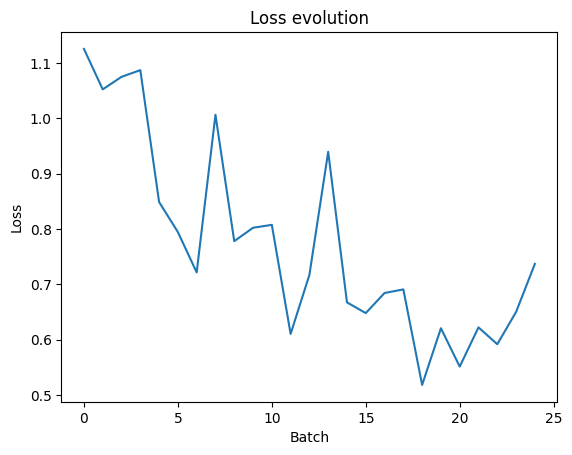

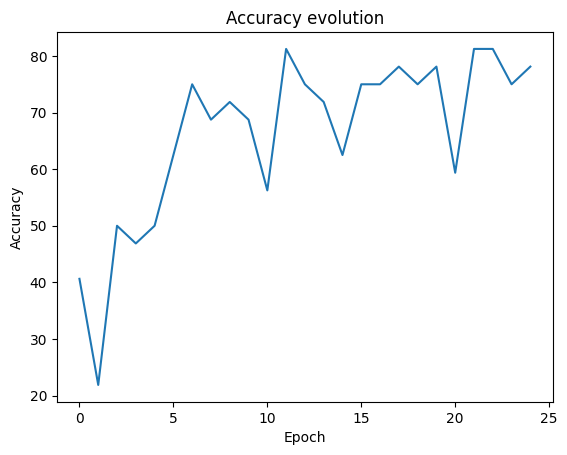

In [48]:
# Plot the loss evolution
plt.plot(loss_evolution)
plt.title('Loss evolution')
plt.xlabel('Batch')
plt.ylabel('Loss')
plt.show()

# Plot the accuracy evolution
plt.plot(accuracy_evolution)
plt.title('Accuracy evolution')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.show()

# Save the model
torch.save(model.state_dict(), 'resnet101_model.pth')

[[25 10 13]
 [ 2 42  7]
 [13  6 23]]
              precision    recall  f1-score   support

     animals       0.62      0.52      0.57        48
       music       0.72      0.82      0.77        51
         sot       0.53      0.55      0.54        42

    accuracy                           0.64       141
   macro avg       0.63      0.63      0.63       141
weighted avg       0.63      0.64      0.63       141



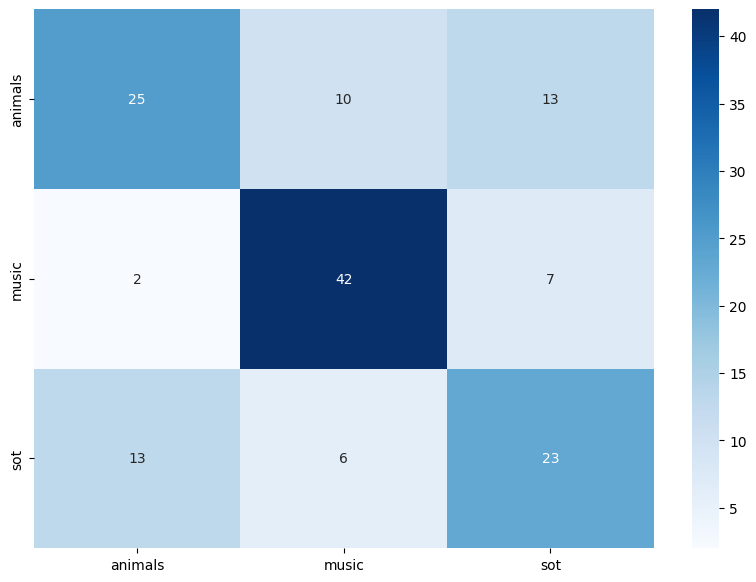

In [50]:
# Confusion matrix


# Get the predictions for the test set
y_pred = []
y_true = []

with torch.no_grad():
    for data in test_dataloader:
        inputs, _, labels = data
        inputs = inputs.cuda()
        inputs = inputs.unsqueeze(1)
        labels = name_tuple_to_float_tensor(labels).cuda()
        labels = labels.long()
        outputs = model(inputs)
        _, predicted = torch.max(outputs.data, 1)
        y_pred += predicted.tolist()
        y_true += labels.tolist()

# Compute and print a pretty confusion matrix
conf_matrix = confusion_matrix(y_true, y_pred)
print(conf_matrix)


# Create a dataframe from the confusion matrix
df_cm = pd.DataFrame(conf_matrix, index = [i for i in ['animals', 'music', 'sot']],
                  columns = [i for i in ['animals', 'music', 'sot']])
plt.figure(figsize = (10,7))
sns.heatmap(df_cm, annot=True, cmap='Blues')

# Print the classification report
print(classification_report(y_true, y_pred, target_names=['animals', 'music', 'sot']))


In [52]:
# Get 1 prediction for the test set with the file paths
dataiter = iter(test_dataloader_with_path)
mfcctensor, sample_rate, classe, file = next(dataiter)
print(mfcctensor.shape, sample_rate, classe, file)

# Get the prediction for the test set
with torch.no_grad():
    inputs = mfcctensor.cuda()
    inputs = inputs.unsqueeze(1)
    outputs = model(inputs)
    _, predicted = torch.max(outputs.data, 1)
print("Predicted: ", predicted, "True: ", name_tuple_to_float_tensor(classe).long(), "Class: ", classe)

# Read with ipython.display.Audio
import IPython.display as ipd
import torchaudio 
waveform, sample_rate = torchaudio.load(file[0])
ipd.Audio(waveform, rate=sample_rate)

torch.Size([32, 40, 3001]) tensor([48000, 48000, 48000, 48000, 48000, 48000, 48000, 48000, 48000, 48000,
        48000, 48000, 48000, 48000, 48000, 48000, 48000, 48000, 48000, 48000,
        48000, 48000, 48000, 48000, 48000, 48000, 48000, 48000, 48000, 48000,
        48000, 48000]) ('sot', 'animals', 'animals', 'sot', 'animals', 'sot', 'sot', 'animals', 'music', 'animals', 'music', 'sot', 'animals', 'music', 'animals', 'animals', 'sot', 'music', 'sot', 'music', 'music', 'sot', 'animals', 'music', 'music', 'sot', 'sot', 'sot', 'sot', 'animals', 'sot', 'sot') ('/kaggle/input/trainset/TrainSet/SoT/sound_of_things_segmented/Y8W0KcQLImuo.wav', '/kaggle/input/trainset/TrainSet/Animals/animals_segmented/YNhgdXiorn1c.wav', '/kaggle/input/trainset/TrainSet/Animals/animals_segmented/Y7F01MogWvhQ.wav', '/kaggle/input/trainset/TrainSet/SoT/sound_of_things_segmented/Y5ftfKerE6s0.wav', '/kaggle/input/trainset/TrainSet/Animals/animals_segmented/Y5wjiU7kz9rM.wav', '/kaggle/input/trainset/TrainSet/SoT